<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230511.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)

# 준비
+ synthetic data를 만든다.
+ 해당 data는 importance가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다. 

## synthetic data의 생성

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 importance

In [4]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [5]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

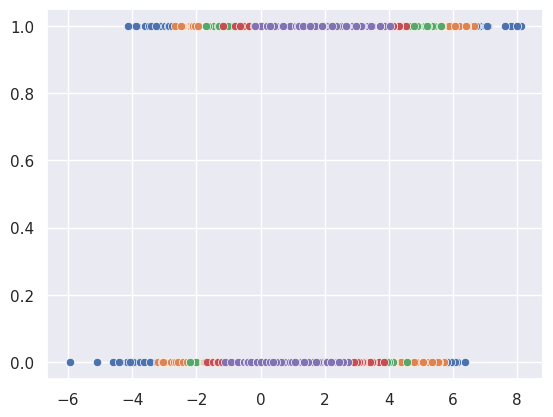

In [6]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    sns.scatterplot(x=x[:,ix],y=y)

<Axes: >

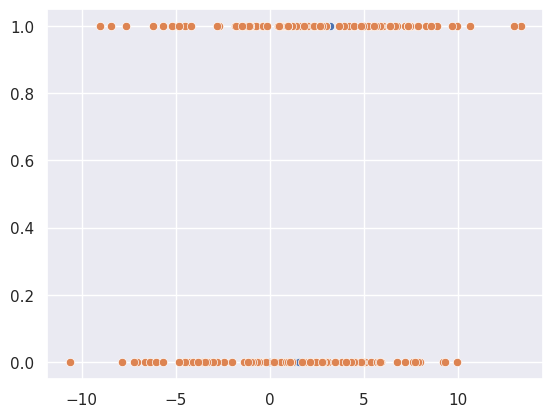

In [7]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)    
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
sns.scatterplot(x=x[0:200,4],y=y[0:200])
sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

## Mutual Information의 측정

In [8]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [9]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


### Bucket 별 MI 측정

+ Bucket을 10, 50, 100 으로 나눠서

Bucket size 10


100%|██████████| 10/10 [00:01<00:00,  8.02it/s]


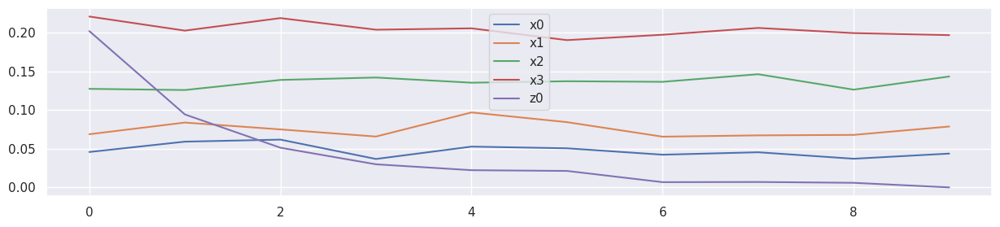

Bucket size 50


100%|██████████| 50/50 [00:01<00:00, 33.64it/s]


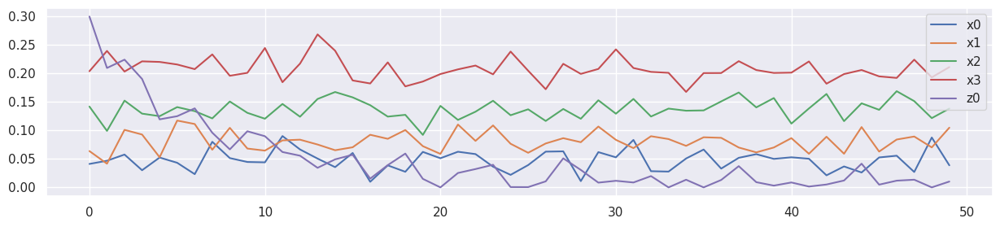

Bucket size 100


100%|██████████| 100/100 [00:02<00:00, 40.85it/s]


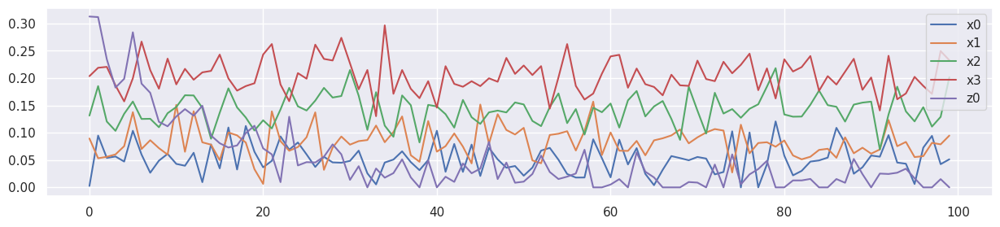

Bucket size 200


100%|██████████| 200/200 [00:02<00:00, 78.30it/s]


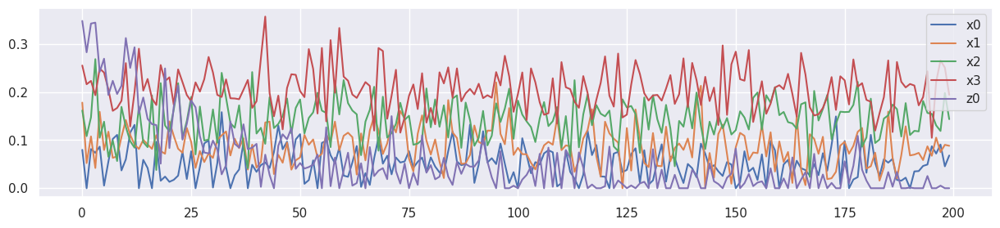

In [10]:
from tqdm import tqdm

bucket_size_array=[10,50,100,200]

for bucket_size in bucket_size_array:
    #bucket_size = 10
    print('Bucket size',bucket_size)
    MIS = {}
    for col in columns:
        MIS[col] = []

    step_size = int(x.shape[0]/bucket_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*step_size:bk*step_size+step_size], y[bk*step_size:bk*step_size+step_size], discrete_features="auto")
        for col in columns:
            MIS[col].append(mi_scores[col]) 

    df_mis = pd.DataFrame(MIS)
    df_mis.plot(figsize=(15,3))
    plt.show()

+ 상기 실험에서, z0의 MI는 bucket의 증가에 따라, 낮아지는 것을 확인할 수 있다.

# Deep architecture에 의한 y의 추정 실험

+ 2000개를 학습하고, 이후 38000개를 추정한다.

## 학습데이터, 2000개 내 bucket 20개의 importance 변화

100%|██████████| 20/20 [00:00<00:00, 115.76it/s]


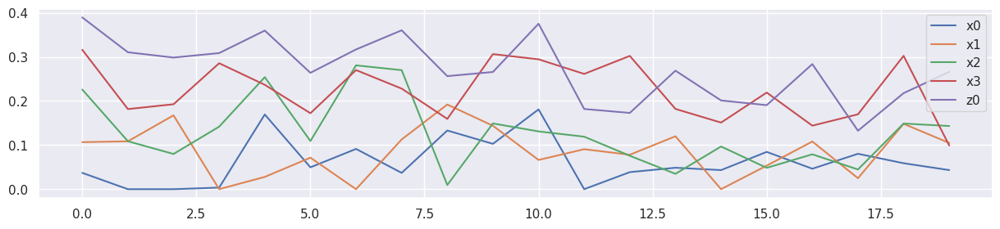

In [11]:
MIS = {}
for col in columns:
    MIS[col] = []
        
for bk in tqdm(range(20)):
    bx = X[bk*100:(bk+1)*100]
    by = y[bk*100:(bk+1)*100]
    mi_scores = make_mi_scores(bx, by, discrete_features="auto")
    for col in columns:
        MIS[col].append(mi_scores[col]) 

df_mis = pd.DataFrame(MIS)
df_mis.plot(figsize=(15,3))
plt.show()

## feature 5개를 모두 포함한 학습

100%|██████████| 1000/1000 [00:22<00:00, 43.56it/s]


MSE: 0.26
RMSE: 0.51


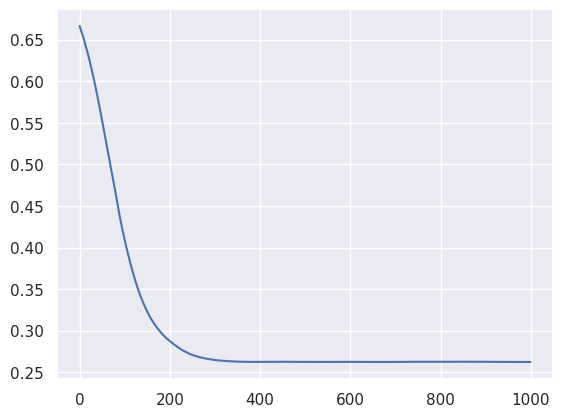

In [12]:
import copy
import torch.optim as optim
 
seed_everything()

# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

+ F1 측정

+ 비교 대상의 측정치

In [13]:
result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

In [14]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

feature 5, test_f1 0.8685714285714285


+ 2000~40000까지의 R-squared score 측정 

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 544.93it/s]


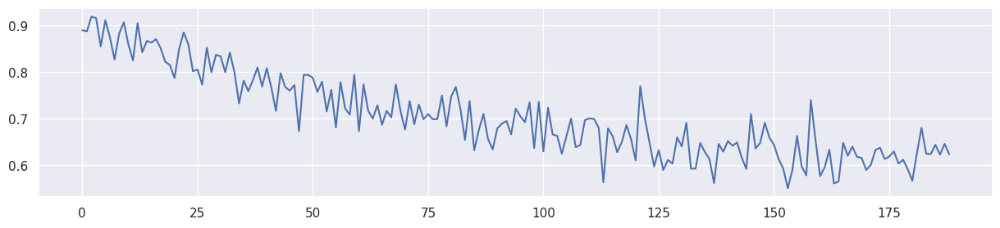

{'lambda': ['Feature 5'], 'test_f1': [0.8685714285714285], 'init_f1': [0.8899082568807338], 'mean_f1': [0.7058765598487894], 'last_f1': [0.6238532110091742], 'MI(y^,z)': [0.2622620324764773]}


In [15]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

print(result_table3)


## feature 5개 + bucket(B) = feature 6개를 학습

In [16]:
# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


100%|██████████| 1000/1000 [00:23<00:00, 41.99it/s]


MSE: 0.30
RMSE: 0.54


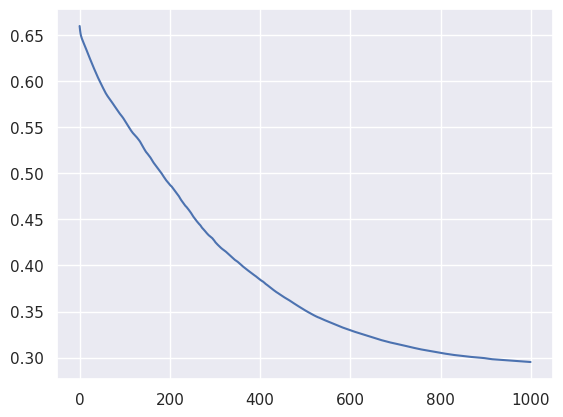

In [17]:
seed_everything()

X_train = torch.tensor(X[0:1800].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(6, 24),
    nn.ReLU(),
    nn.Linear(24, 6),
    nn.ReLU(),
    nn.Linear(6, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [18]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.875


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 542.24it/s]


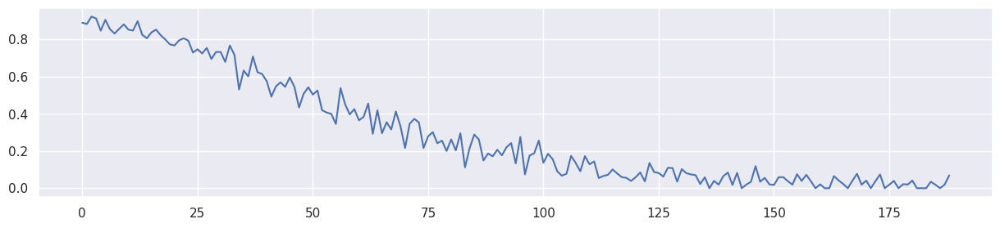

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467


In [19]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0','b']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 6')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

## z0를 빼고, 4개 feature로 학습

100%|██████████| 1000/1000 [00:19<00:00, 50.09it/s]


MSE: 0.13
RMSE: 0.36


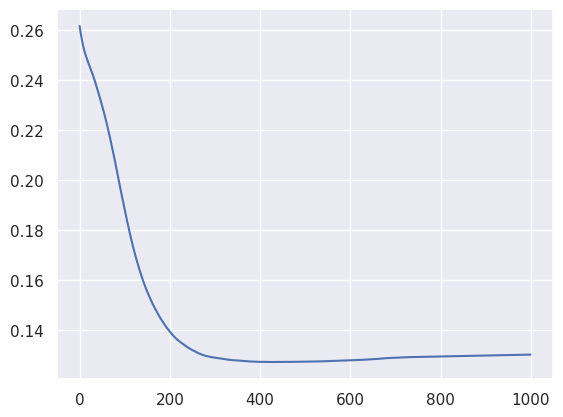

In [20]:
seed_everything()

X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(4, 16),
    nn.ReLU(),
    nn.Linear(16, 4),
    nn.ReLU(),
    nn.Linear(4, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.MSELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100 # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [21]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.7657142857142858


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 584.01it/s]


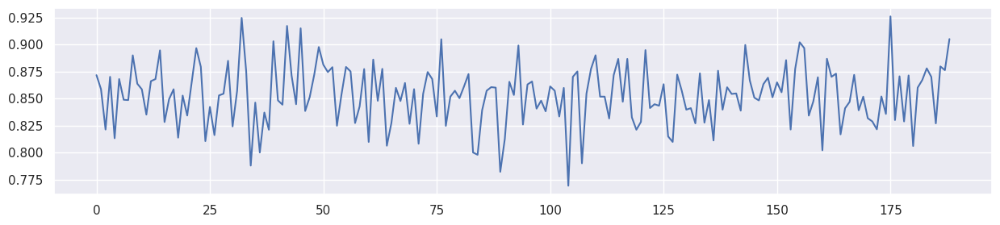

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596


In [22]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(X[1800:2000][['z0']], predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 4')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

+ 위에서 보면.... 학습과정에서, 현재는 학습에 효과가 있지만 향후 잠재적으로 성능을 저해할 수 있는 feature를 탐지하여 이의 효과를 경감 또는 (보정) 할 수 있는 학습 방법을 찾아야 하는 것!!!

## RF-Train의 적용

+ 위의 데이터에서, sensitive attribute는 z0에 대당된다.
+ 따라서, MI(y^|z0) = 0 이되어야 하고,
+ Fairness discriminator에서는  Y^과 z0의 loss가 커야 한다! 즉, 최대한 상관 없어야 한다.
+ OK, 일단 이렇게 구성해 본다!

In [23]:
!git clone https://github.com/yuji-roh/fr-train.git

Cloning into 'fr-train'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 31 (delta 9), reused 4 (delta 0), pack-reused 0
Unpacking objects: 100% (31/31), 168.32 KiB | 3.66 MiB/s, done.


In [24]:
%cd fr-train
!pwd

/content/fr-train
/content/fr-train


In [25]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

+ Generator의 구현 = 위에서 feature 5개의 model과 동일
+ DiscriminatorF = Y^과 z0가 같아지지 않게 학습 ??

In [26]:

def test_model(model_, tX, ty, s1):
    """Tests the performance of a model.

    Args:
        model_: A model to test.
        X: Input features of test data.
        y: True label (1-D) of test data.
        s1: Sensitive attribute (1-D) of test data.

    Returns:
        The test accuracy and disparate impact of the model.
    """
    
    model_.eval()
    
    y_hat = model_(tX)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [27]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).
    
    This class is for defining the structure of FR-Train generator (classifier). 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted label (y_hat) for the given input data.
        """
        
        output = self.model(input_data)
        return output

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 8),
            nn.Linear(8, 1),
            nn.Sigmoid()            
        )

    def forward(self, x1, x2):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(torch.cat((x1, x2), 1))
        return predicted_z
    

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF2(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF2, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(1, 4),
            nn.Linear(4, 1)       
        )

    def forward(self, x1):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(x1)
        return predicted_z
    

In [28]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    #mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.SGD(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_loss.backward()
        g_losses.append(g_loss)
        optimizer_G.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1, mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1, mi, generator

In [29]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model2(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 
        #r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        #f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        d_f_loss =  (r_loss + f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [30]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model22(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF2()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 

        # y와 z는 상관관계가 있으므로... r_loss는 최소화 시키고...
        r_loss = mse_loss(discriminator_F(y_train.reshape(-1,1)), s1_train.reshape(-1,1))
        # y^와 z는 최대한 무관하게... f_loss 최대화 시킨다..
        f_loss = mse_loss(discriminator_F(gen_y), s1_train.reshape(-1,1)) * 0.3

        d_f_loss =  (r_loss - f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [31]:
def test_all_data(generator):

    XT = X[2000:][['x0','x1','x2','x3','z0']]
    yT = y[2000:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 532.32it/s]


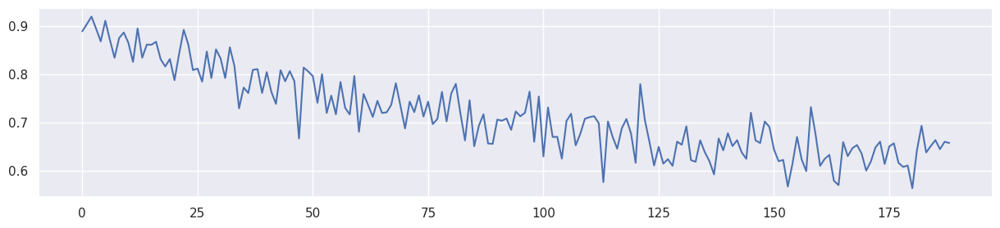

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.764362]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 1.385715] [G loss: 0.748424]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 1.379816] [G loss: 0.721642]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 1.369719] [G loss: 0.692447]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 1.361597] [G loss: 0.661667]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 1.359293] [G loss: 0.629466]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 1.361002] [G loss: 0.596741]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 1.364285] [G loss: 0.563744]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 1.368029] [G loss: 0.531376]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 1.371691] [G loss: 0.499893]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 1.375391] [G loss: 0.471105]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 1.378541] [G loss: 0.446026]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 528.94it/s]


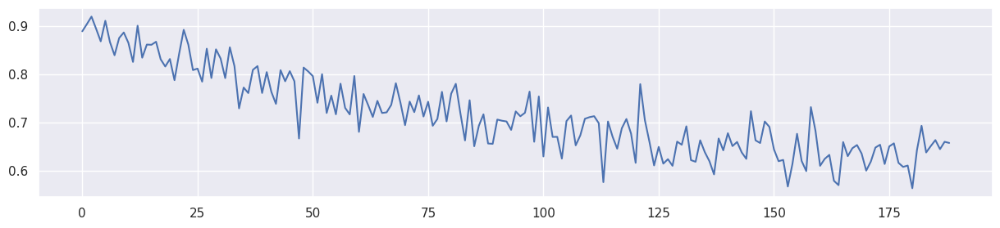

Mean F1 for all data: 0.7170752811002495
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.833470]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 1.385707] [G loss: 0.819187]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 1.379258] [G loss: 0.794397]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 1.366871] [G loss: 0.767057]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 1.356213] [G loss: 0.738834]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 1.352614] [G loss: 0.710249]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 1.354327] [G loss: 0.681624]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 1.358530] [G loss: 0.652855]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 1.363285] [G loss: 0.624682]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 1.367940] [G loss: 0.597245]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 1.372620] [G loss: 0.572237]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 1.376529] [G loss: 0.550378]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 544.79it/s]


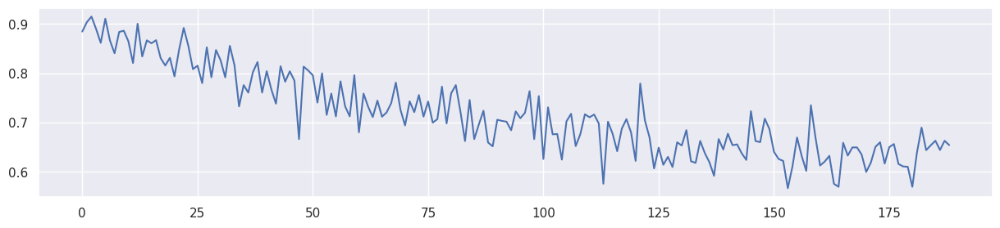

Mean F1 for all data: 0.7176392703078895
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.902577]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 1.385694] [G loss: 0.889952]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 1.378446] [G loss: 0.867016]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 1.362389] [G loss: 0.841007]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 1.346843] [G loss: 0.814999]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 1.340973] [G loss: 0.789855]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 1.342740] [G loss: 0.765414]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 1.347965] [G loss: 0.741051]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 1.354569] [G loss: 0.717224]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 1.361214] [G loss: 0.694209]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 1.367935] [G loss: 0.672916]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 1.373051] [G loss: 0.654382]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 490.63it/s]


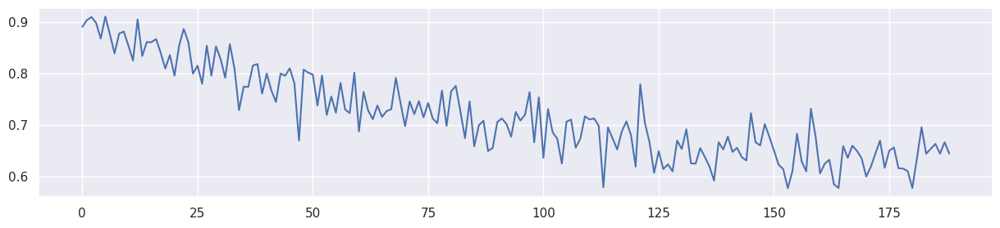

Mean F1 for all data: 0.7185592664472374
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.971684]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 1.385651] [G loss: 0.960716]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 1.377058] [G loss: 0.939390]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 1.354234] [G loss: 0.913654]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 1.329525] [G loss: 0.888927]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 1.318446] [G loss: 0.867105]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 1.319636] [G loss: 0.847041]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 1.326619] [G loss: 0.827323]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 1.335312] [G loss: 0.808170]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 1.345256] [G loss: 0.790189]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 1.355975] [G loss: 0.773466]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 1.364479] [G loss: 0.758702]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 497.26it/s]


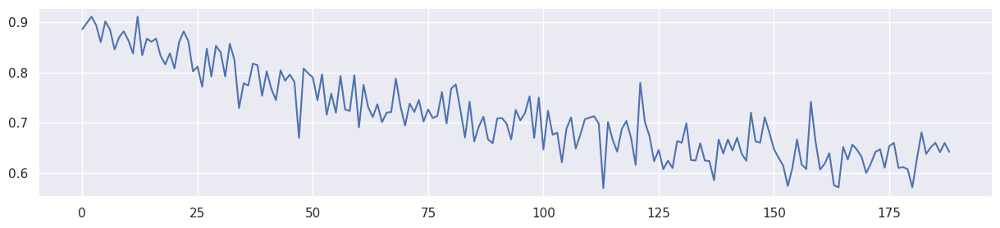

Mean F1 for all data: 0.7167253932627029
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.040792]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 1.385086] [G loss: 1.031416]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 1.365266] [G loss: 1.010256]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 1.314786] [G loss: 0.982919]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 1.272523] [G loss: 0.960884]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 1.258220] [G loss: 0.943746]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 1.258618] [G loss: 0.928428]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 1.265445] [G loss: 0.913316]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 1.274769] [G loss: 0.899293]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 1.288390] [G loss: 0.886958]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 1.305206] [G loss: 0.875826]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 1.322718] [G loss: 0.865882]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 568.01it/s]


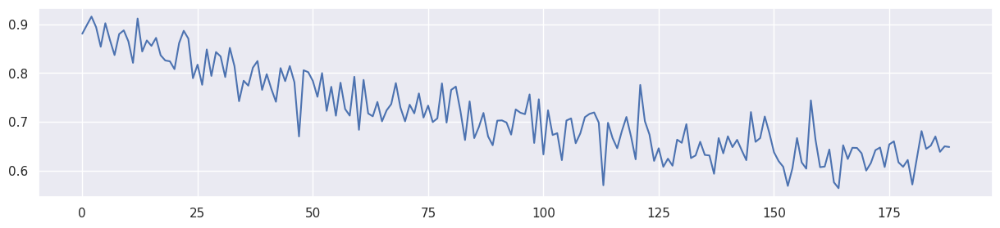

Mean F1 for all data: 0.7167127527365508
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.109899]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 1.384624] [G loss: 1.101906]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 1.359386] [G loss: 1.078351]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 1.286432] [G loss: 1.040596]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 1.209704] [G loss: 1.013610]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 1.178468] [G loss: 1.000641]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 1.171643] [G loss: 0.989958]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 1.170897] [G loss: 0.979577]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 1.171882] [G loss: 0.970391]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 1.174338] [G loss: 0.963218]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 1.180548] [G loss: 0.957647]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 1.187490] [G loss: 0.953297]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 555.91it/s]


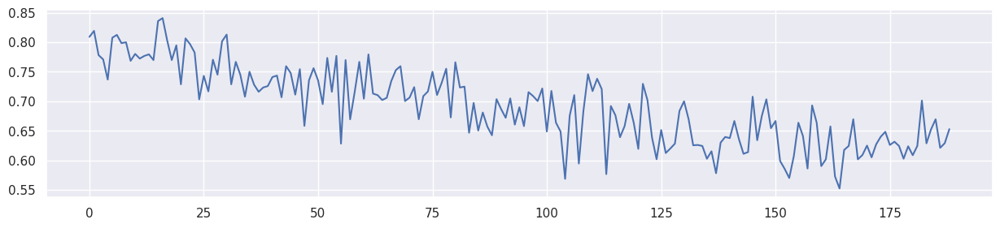

Mean F1 for all data: 0.6920651744572759
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.179006]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 1.384364] [G loss: 1.172318]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 1.352243] [G loss: 1.144222]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 1.258361] [G loss: 1.089529]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 1.159981] [G loss: 1.048331]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 1.106515] [G loss: 1.033059]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 1.087656] [G loss: 1.025751]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 1.081853] [G loss: 1.018618]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 1.079078] [G loss: 1.012759]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 1.078944] [G loss: 1.008387]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 1.079955] [G loss: 1.005195]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 1.082163] [G loss: 1.002947]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 520.77it/s]


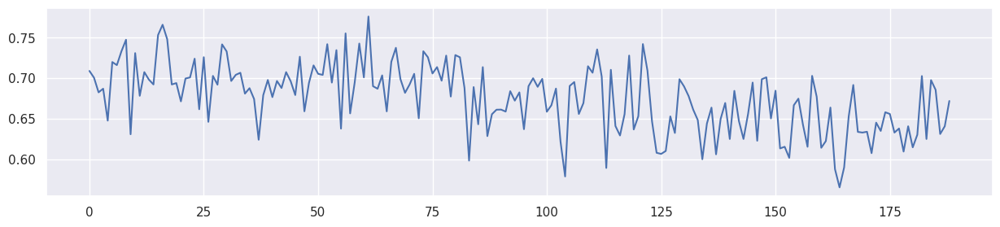

Mean F1 for all data: 0.6753669541018387
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.248114]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 1.383965] [G loss: 1.242565]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 1.342603] [G loss: 1.206555]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 1.228619] [G loss: 1.127630]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 1.110430] [G loss: 1.062804]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 1.041890] [G loss: 1.037911]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 1.013064] [G loss: 1.031554]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 1.004443] [G loss: 1.028972]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 1.003139] [G loss: 1.026490]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 1.004279] [G loss: 1.024116]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 1.005393] [G loss: 1.021933]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 1.006182] [G loss: 1.019991]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 486.23it/s]


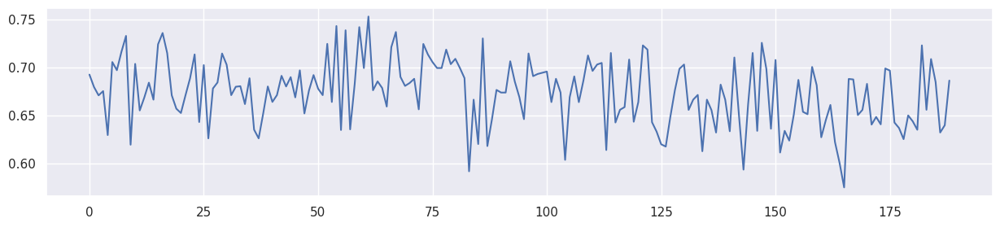

Mean F1 for all data: 0.6738261290572612
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.317221]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 1.383212] [G loss: 1.312479]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 1.329523] [G loss: 1.263401]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 1.193672] [G loss: 1.150553]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 1.067595] [G loss: 1.057278]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.996382] [G loss: 1.015475]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.963312] [G loss: 1.003049]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.951129] [G loss: 1.000448]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.947176] [G loss: 0.999522]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.946042] [G loss: 0.998792]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.945847] [G loss: 0.998031]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: 0.945854] [G loss: 0.997296]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 496.25it/s]


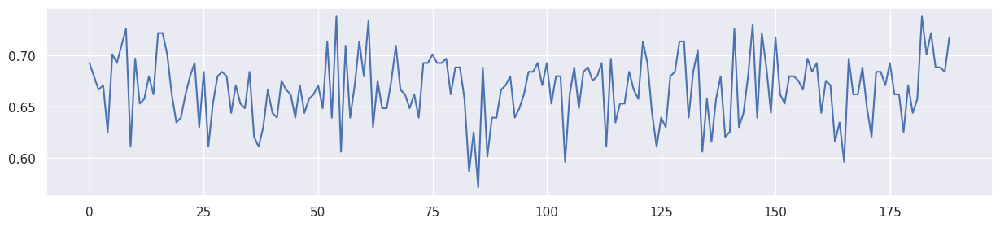

Mean F1 for all data: 0.6673744009113316


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,2.622620e-01
1,Feature 6,0.875000,0.889908,0.299320,0.068966,2.304670e-01
2,Feature 4,0.765714,0.871560,0.853043,0.904977,7.959555e-02
0,0.0,0.875000,0.888889,0.716996,0.657407,2.616669e-01
1,0.1,0.875000,0.888889,0.717075,0.657407,2.616669e-01
2,0.2,0.881356,0.884793,0.717639,0.654378,2.598196e-01
3,0.3,0.868571,0.890909,0.718559,0.644860,2.455515e-01
4,0.4,0.865169,0.885845,0.716725,0.642202,2.771431e-01
5,0.5,0.876404,0.880734,0.716713,0.648402,2.707110e-01
6,0.6,0.744589,0.809160,0.692065,0.652893,2.988178e-01


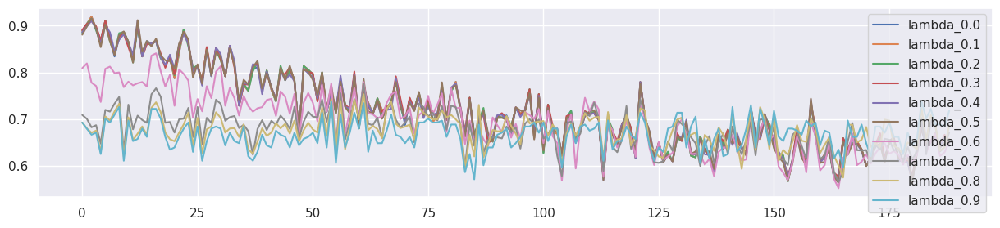

In [32]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model2(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 562.30it/s]


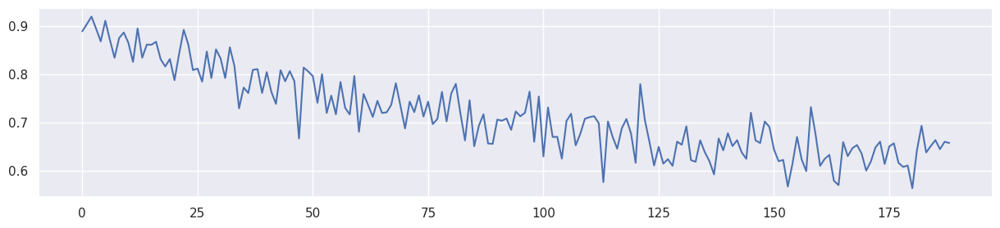

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.832770]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 0.833585] [G loss: 0.693393]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 0.213729] [G loss: 0.605726]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 0.195657] [G loss: 0.575629]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 0.201150] [G loss: 0.545888]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 0.207711] [G loss: 0.514309]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 0.215046] [G loss: 0.481998]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 0.222711] [G loss: 0.449594]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 0.230764] [G loss: 0.417634]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 0.238594] [G loss: 0.386567]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 0.245514] [G loss: 0.357749]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 0.251274] [G loss: 0.332951]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 554.04it/s]


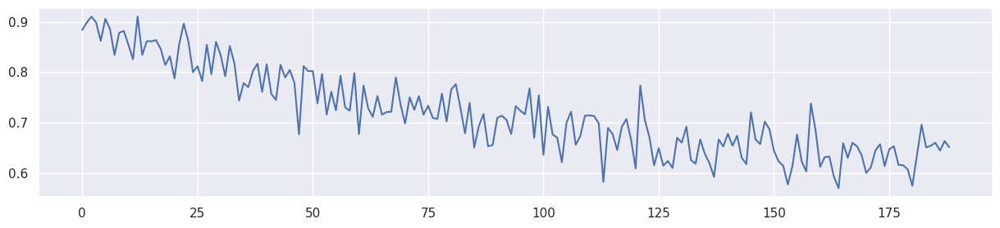

Mean F1 for all data: 0.7185376599958405
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.970285]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 0.833493] [G loss: 0.709108]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 0.213596] [G loss: 0.562590]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 0.195530] [G loss: 0.533671]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 0.200929] [G loss: 0.507758]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 0.207242] [G loss: 0.480435]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 0.214180] [G loss: 0.452573]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 0.221563] [G loss: 0.424577]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 0.229084] [G loss: 0.397316]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 0.236730] [G loss: 0.370482]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 0.243736] [G loss: 0.345589]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 0.249563] [G loss: 0.323892]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 546.32it/s]


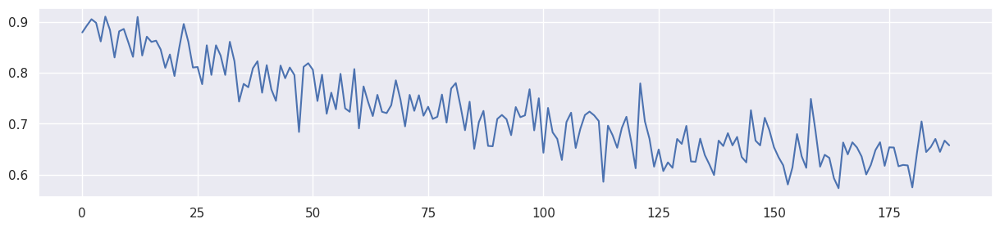

Mean F1 for all data: 0.7216524100013421
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.107801]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 0.833361] [G loss: 0.724797]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 0.213414] [G loss: 0.519434]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 0.195383] [G loss: 0.491674]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 0.200621] [G loss: 0.469555]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 0.206596] [G loss: 0.446452]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 0.213078] [G loss: 0.422978]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 0.219985] [G loss: 0.399436]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 0.226841] [G loss: 0.376687]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 0.234317] [G loss: 0.354236]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 0.241239] [G loss: 0.333451]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 0.247465] [G loss: 0.314807]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 570.15it/s]


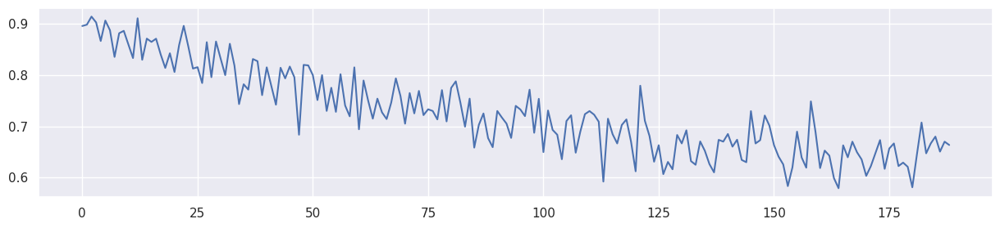

Mean F1 for all data: 0.7269675778448235
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.245316]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 0.833172] [G loss: 0.740447]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 0.213155] [G loss: 0.476251]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 0.195186] [G loss: 0.449649]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 0.200202] [G loss: 0.431314]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 0.205708] [G loss: 0.412349]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 0.211479] [G loss: 0.393117]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 0.217768] [G loss: 0.374099]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 0.224007] [G loss: 0.355630]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 0.230662] [G loss: 0.337730]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 0.237457] [G loss: 0.321209]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 0.243867] [G loss: 0.305841]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 540.87it/s]


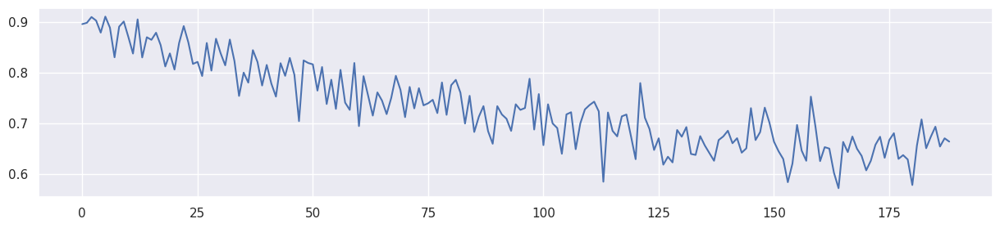

Mean F1 for all data: 0.7320094897045366
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.382831]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 0.832889] [G loss: 0.756029]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 0.212725] [G loss: 0.433048]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 0.194867] [G loss: 0.407642]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 0.199480] [G loss: 0.393084]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 0.204273] [G loss: 0.378121]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 0.209030] [G loss: 0.363057]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 0.214099] [G loss: 0.348410]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 0.219668] [G loss: 0.334297]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 0.225354] [G loss: 0.320795]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 0.231430] [G loss: 0.308606]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 0.237385] [G loss: 0.297327]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 464.09it/s]


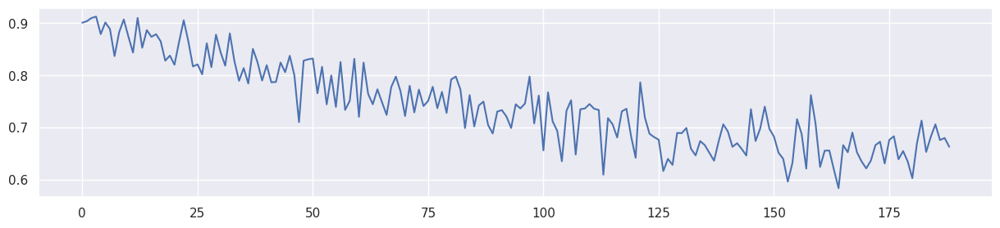

Mean F1 for all data: 0.7423708784087666
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.520346]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 0.832396] [G loss: 0.771489]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 0.211923] [G loss: 0.389839]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 0.194212] [G loss: 0.365749]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 0.198079] [G loss: 0.354855]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 0.201653] [G loss: 0.343617]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 0.204925] [G loss: 0.332331]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 0.208073] [G loss: 0.321580]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 0.211207] [G loss: 0.311396]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 0.214972] [G loss: 0.302308]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 0.219893] [G loss: 0.294440]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 0.225597] [G loss: 0.287040]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 555.08it/s]


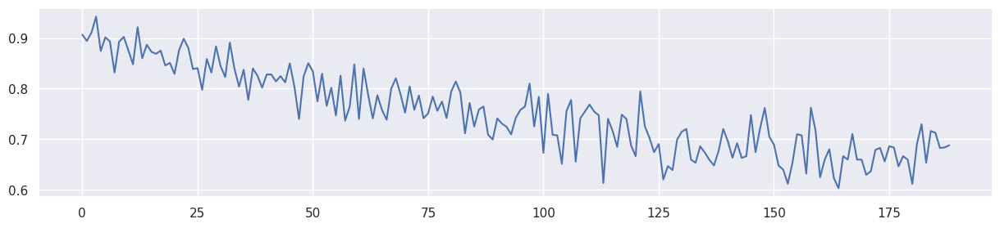

Mean F1 for all data: 0.7527366964536193
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.657862]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 0.831427] [G loss: 0.786655]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 0.210112] [G loss: 0.346536]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 0.192568] [G loss: 0.324029]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 0.194762] [G loss: 0.316384]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 0.195838] [G loss: 0.308375]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 0.196137] [G loss: 0.300295]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 0.195451] [G loss: 0.292440]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 0.194416] [G loss: 0.285362]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 0.194358] [G loss: 0.279568]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 0.195843] [G loss: 0.275178]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 0.198861] [G loss: 0.271833]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 531.84it/s]


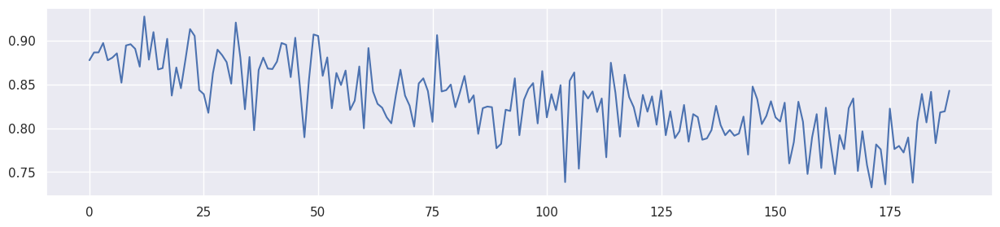

Mean F1 for all data: 0.8317330429719453
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.795377]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 0.829699] [G loss: 0.801038]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 0.205401] [G loss: 0.301996]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 0.186129] [G loss: 0.281527]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 0.185560] [G loss: 0.276170]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 0.180609] [G loss: 0.269275]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 0.168397] [G loss: 0.259846]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 0.153192] [G loss: 0.250935]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 0.138239] [G loss: 0.244367]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 0.126285] [G loss: 0.240322]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 0.118502] [G loss: 0.238091]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 0.113225] [G loss: 0.236786]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 514.53it/s]


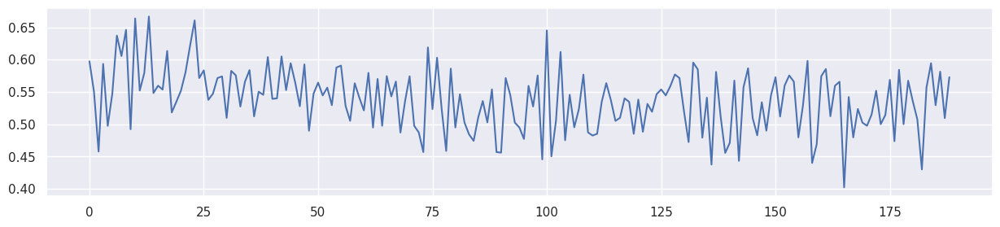

Mean F1 for all data: 0.5379492848216061
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.932892]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 0.826662] [G loss: 0.813539]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 0.199632] [G loss: 0.251200]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 0.174581] [G loss: 0.230232]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 0.165154] [G loss: 0.224741]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.148569] [G loss: 0.214766]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.124850] [G loss: 0.198967]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.095280] [G loss: 0.179875]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.062169] [G loss: 0.161178]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.031257] [G loss: 0.146792]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.006739] [G loss: 0.137536]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: -0.010526] [G loss: 0.131840]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F

100%|██████████| 189/189 [00:00<00:00, 533.91it/s]


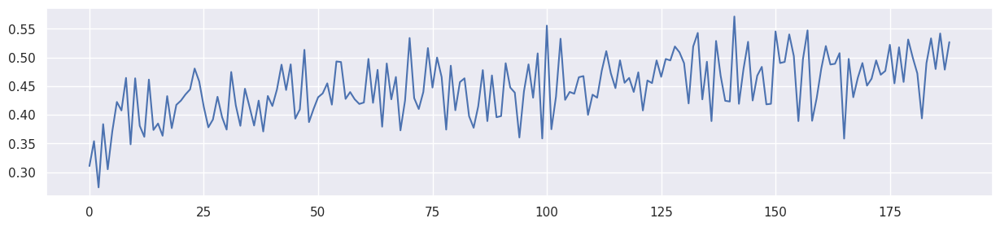

Mean F1 for all data: 0.4473343509454414


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


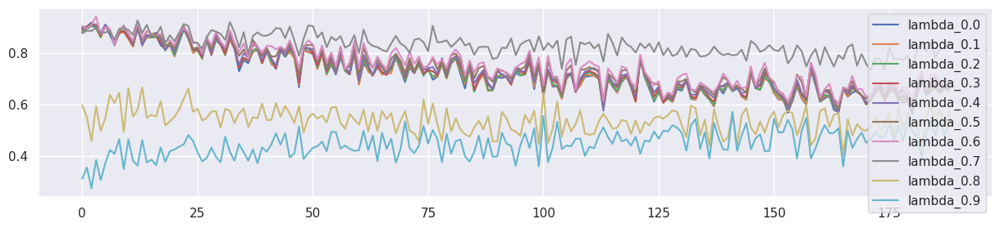

In [33]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model22(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


## MINE를 통해 I(y^,z) 측정

(40000, 5)
(40000,)


100%|██████████| 300/300 [00:00<00:00, 511.60it/s]

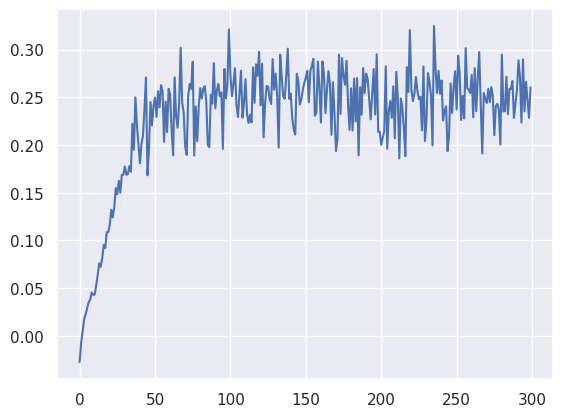

In [67]:
from tqdm import tqdm

H=20
n_epoch = 300
minibatch = 1000

x1 = X[0:1800][['z0']].values
y1 = y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss)

In [35]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model3(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        ret = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = torch.abs(ret)  # maximize

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(mi_loss)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss   + lambda_f * (mi_loss * 1000) 
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 567.87it/s]


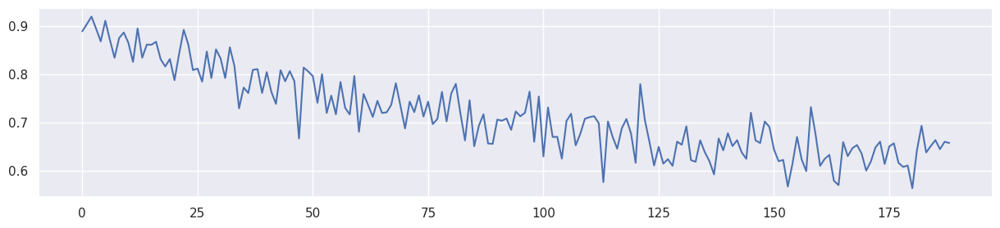

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 0.001382] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 0.000033] [G loss: 0.690755]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 0.000006] [G loss: 0.681420]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 0.000039] [G loss: 0.659968]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 0.000000] [G loss: 0.635912]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 0.000003] [G loss: 0.608296]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 0.000029] [G loss: 0.577849]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 0.000006] [G loss: 0.544051]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 0.000008] [G loss: 0.508844]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 0.000030] [G loss: 0.472724]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 0.000014] [G loss: 0.437017]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 0.000053] [G loss: 0.402527]
[Lambda: 0.100000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 517.29it/s]


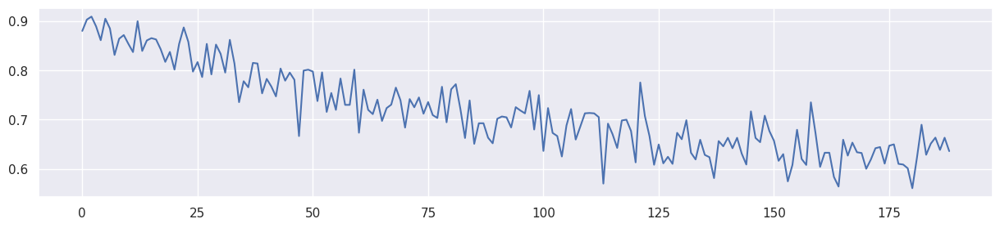

Mean F1 for all data: 0.7158111235910948
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 0.001319] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 0.000026] [G loss: 0.693419]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 0.000019] [G loss: 0.690087]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 0.000002] [G loss: 0.683295]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 0.000039] [G loss: 0.668395]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 0.000009] [G loss: 0.651813]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 0.000008] [G loss: 0.633106]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 0.000005] [G loss: 0.610163]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 0.000001] [G loss: 0.582717]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 0.000005] [G loss: 0.551574]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 0.000004] [G loss: 0.519417]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 0.000004] [G loss: 0.486115]
[Lambda: 0.200000] [Epoch 2400/4000] [mi loss: 0.00002

100%|██████████| 189/189 [00:00<00:00, 557.96it/s]


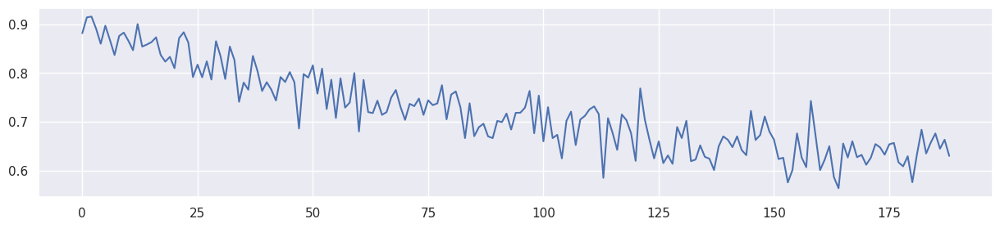

Mean F1 for all data: 0.7204850555787756
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 0.001269] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 0.000043] [G loss: 0.694415]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 0.000009] [G loss: 0.692613]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 0.000013] [G loss: 0.688427]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 0.000048] [G loss: 0.684359]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 0.000241] [G loss: 0.675724]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 0.000034] [G loss: 0.669284]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 0.000048] [G loss: 0.660440]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 0.000002] [G loss: 0.648762]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 0.000011] [G loss: 0.633448]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 0.000060] [G loss: 0.614522]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 0.000002] [G loss: 0.591062]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 552.12it/s]


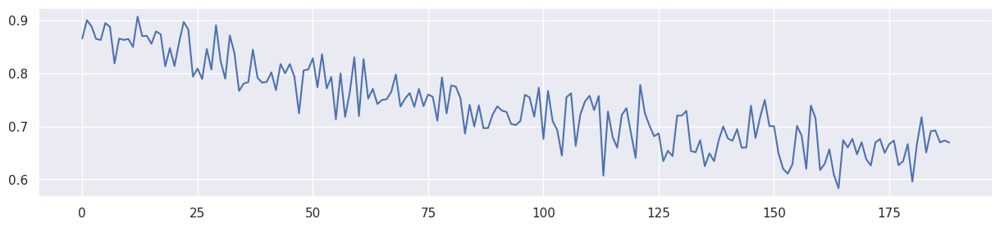

Mean F1 for all data: 0.7389643629068499
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 0.001424] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 0.000124] [G loss: 0.694605]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 0.000074] [G loss: 0.694050]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 0.000015] [G loss: 0.692759]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 0.000003] [G loss: 0.689349]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 0.000030] [G loss: 0.682647]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 0.000047] [G loss: 0.674925]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 0.000018] [G loss: 0.667926]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.661520]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 0.000001] [G loss: 0.654844]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 0.000001] [G loss: 0.646025]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 0.000001] [G loss: 0.634538]
[Lambda: 0.400000] [Epoch 2400/4000] [mi loss: 0.00001

100%|██████████| 189/189 [00:00<00:00, 568.21it/s]


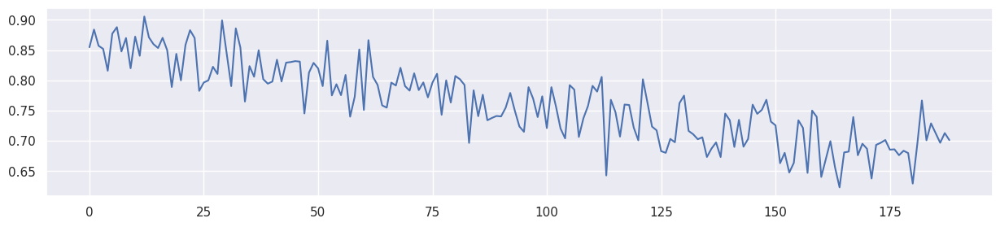

Mean F1 for all data: 0.7630563713146487
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 0.001455] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 0.000047] [G loss: 0.695221]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 0.000047] [G loss: 0.695010]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 0.000040] [G loss: 0.694191]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 0.000005] [G loss: 0.692569]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 0.000006] [G loss: 0.691207]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 0.000020] [G loss: 0.689354]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 0.000016] [G loss: 0.686951]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 0.000011] [G loss: 0.683973]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 0.000026] [G loss: 0.679012]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 0.000011] [G loss: 0.676884]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 0.000042] [G loss: 0.673061]
[Lambda: 0.500000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 571.22it/s]


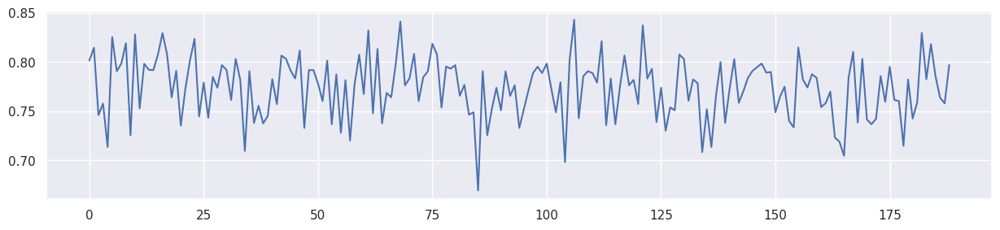

Mean F1 for all data: 0.7739834488772906
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 0.000032] [G loss: 0.695021]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 0.000001] [G loss: 0.694659]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 0.000010] [G loss: 0.694107]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 0.000013] [G loss: 0.693377]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 0.000021] [G loss: 0.692497]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 0.000011] [G loss: 0.691398]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 0.000022] [G loss: 0.691089]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 0.000010] [G loss: 0.689465]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 0.000006] [G loss: 0.687167]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 0.000003] [G loss: 0.684512]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 0.000013] [G loss: 0.682138]
[Lambda: 0.600000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 519.54it/s]


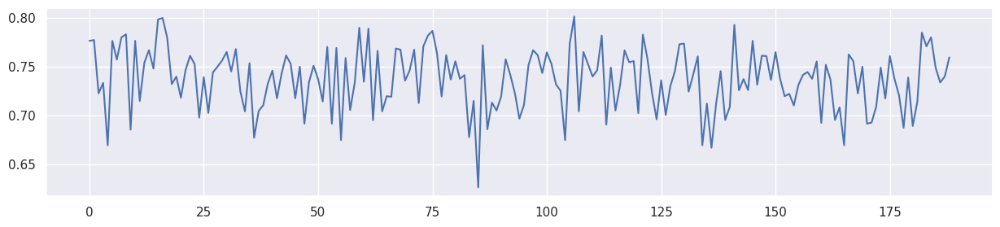

Mean F1 for all data: 0.7369913399400451
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 0.001458] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.000018] [G loss: 0.694955]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 0.000017] [G loss: 0.694699]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 0.000001] [G loss: 0.694332]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 0.000042] [G loss: 0.693868]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 0.000004] [G loss: 0.693068]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 0.000010] [G loss: 0.691803]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 0.000000] [G loss: 0.690402]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 0.000014] [G loss: 0.690424]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 0.000006] [G loss: 0.688923]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 0.000005] [G loss: 0.688630]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 0.000005] [G loss: 0.685949]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 557.25it/s]


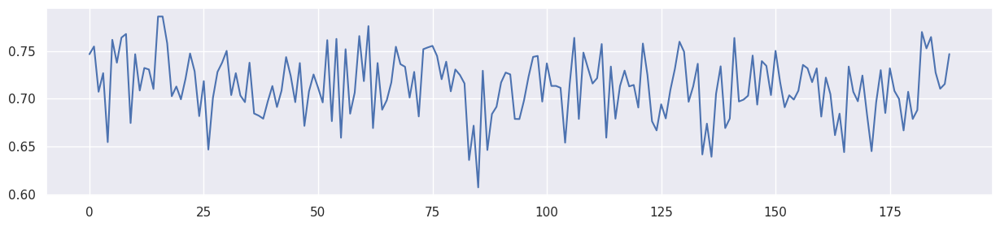

Mean F1 for all data: 0.7130254239268027
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.000067] [G loss: 0.695307]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 0.000010] [G loss: 0.695274]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 0.000015] [G loss: 0.695066]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 0.000024] [G loss: 0.694986]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 0.000027] [G loss: 0.694695]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 0.000016] [G loss: 0.694691]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 0.000014] [G loss: 0.694278]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 0.000003] [G loss: 0.693819]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 0.000002] [G loss: 0.693109]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 0.000001] [G loss: 0.692182]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 0.000008] [G loss: 0.690470]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss: 0.00002

100%|██████████| 189/189 [00:00<00:00, 553.05it/s]


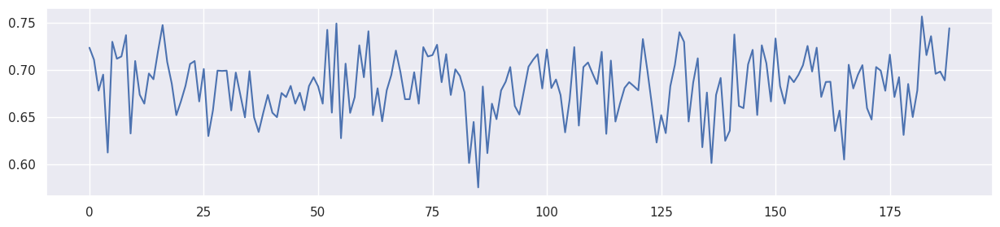

Mean F1 for all data: 0.6830527450484644
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 0.001462] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.000026] [G loss: 0.695110]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 0.000013] [G loss: 0.694912]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 0.000001] [G loss: 0.694565]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 0.000005] [G loss: 0.694528]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 0.000002] [G loss: 0.694619]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 0.000019] [G loss: 0.694768]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 0.000008] [G loss: 0.694500]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 0.000003] [G loss: 0.694248]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 0.000001] [G loss: 0.694077]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 0.000000] [G loss: 0.693883]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 0.000001] [G loss: 0.693599]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 565.47it/s]


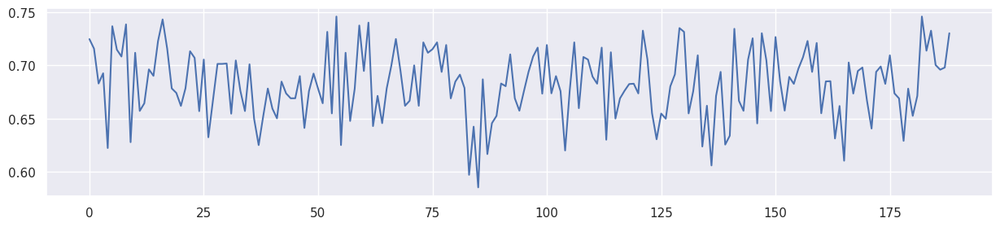

Mean F1 for all data: 0.682196282462926


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


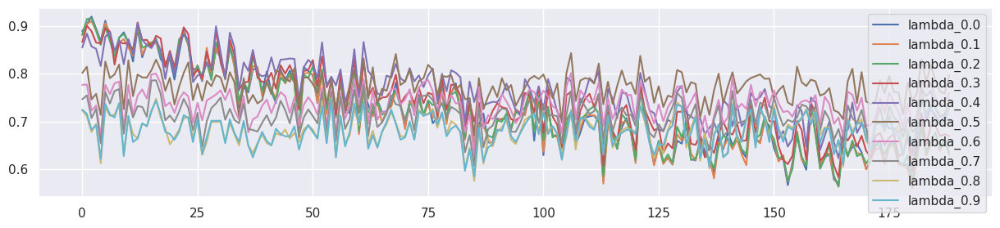

In [36]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model3(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



In [37]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model4(train_tensors, test_tensors, train_opt, lambda_f, seed,alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()  # y^의 샘플
        #y2 = y_train[s].data.numpy().reshape(-1,1) # y의 샘플
        #print('y1',y1.shape)
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        y2_sample = y_train[s].reshape(-1,1) #Variable(torch.from_numpy(y2).type(torch.FloatTensor), requires_grad = True)
        y2_shuffle = y_train[np.random.permutation(s)].reshape(-1,1) #Variable(torch.from_numpy(np.random.permutation(y2)).type(torch.FloatTensor), requires_grad = True)    

        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        ret2 = torch.mean(mine(x_sample, y2_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y2_shuffle))))

        # ret2(y의 샘플)는 maximize 하야 하고
        # ret1(y^의 샘플)는 0으로 minimize 해야 한다.!!! 
        mi_loss = - ret2 + torch.abs(ret1)

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(-ret2)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss  + lambda_f * mi_loss * alpha
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297297]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279801]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265788]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 581.03it/s]


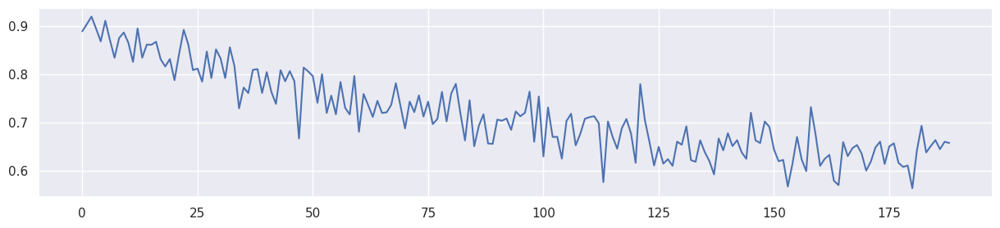

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: -0.000739] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: -0.221459] [G loss: 0.678307]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: -0.236097] [G loss: 0.650746]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: -0.237067] [G loss: 0.619884]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: -0.265851] [G loss: 0.586544]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: -0.245159] [G loss: 0.551310]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: -0.287064] [G loss: 0.515436]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: -0.233238] [G loss: 0.479352]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: -0.227266] [G loss: 0.443846]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: -0.292794] [G loss: 0.409448]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: -0.262103] [G loss: 0.377315]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: -0.254107] [G loss: 0.349314]
[Lambda: 0.100000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 578.71it/s]


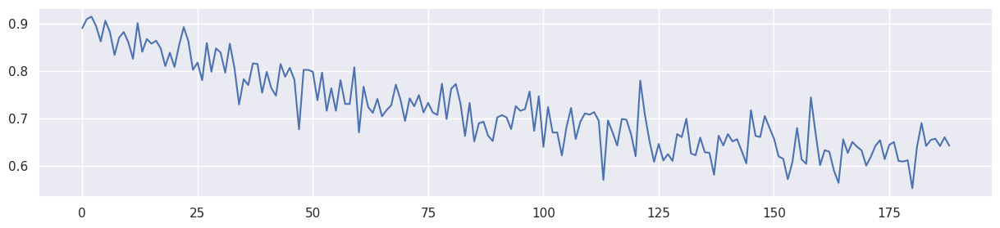

Mean F1 for all data: 0.716283499069889
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: -0.000677] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: -0.246216] [G loss: 0.679504]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: -0.281785] [G loss: 0.653917]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: -0.237927] [G loss: 0.624455]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: -0.249923] [G loss: 0.592192]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: -0.283739] [G loss: 0.558564]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: -0.231853] [G loss: 0.524646]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: -0.211948] [G loss: 0.491112]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: -0.214676] [G loss: 0.457964]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: -0.270468] [G loss: 0.425549]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: -0.280517] [G loss: 0.394703]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: -0.249590] [G loss: 0.366834]
[Lambda: 0.200000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 542.64it/s]


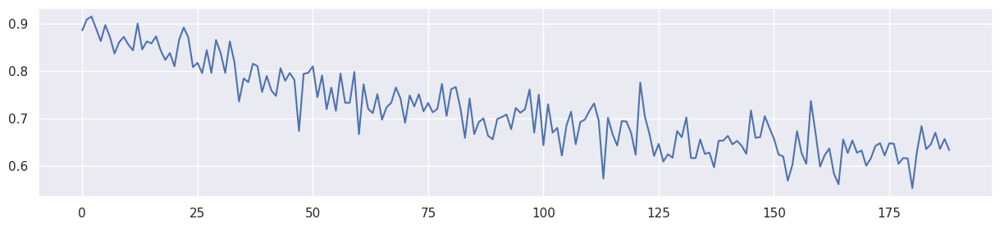

Mean F1 for all data: 0.7168981115363858
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: -0.000742] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: -0.247502] [G loss: 0.681466]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: -0.274608] [G loss: 0.659685]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: -0.176438] [G loss: 0.632509]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: -0.278406] [G loss: 0.602779]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: -0.259545] [G loss: 0.571513]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: -0.268465] [G loss: 0.539885]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: -0.294462] [G loss: 0.508813]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: -0.265693] [G loss: 0.478558]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: -0.213101] [G loss: 0.449275]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: -0.185941] [G loss: 0.420889]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: -0.214079] [G loss: 0.394177]
[Lambda: 0.300000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 576.06it/s]


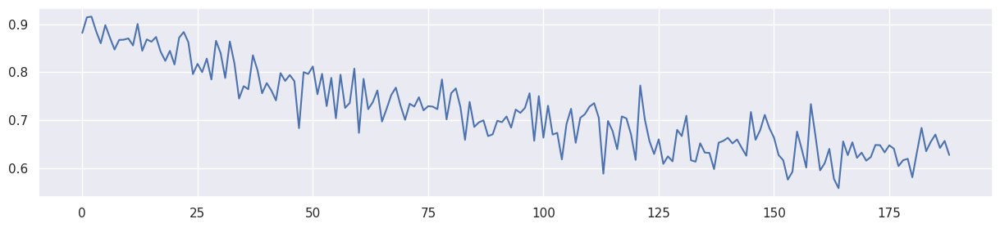

Mean F1 for all data: 0.7190714355267128
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: -0.000893] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: -0.275400] [G loss: 0.682735]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: -0.277922] [G loss: 0.668006]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: -0.216626] [G loss: 0.645305]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: -0.207210] [G loss: 0.619420]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: -0.242585] [G loss: 0.591517]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: -0.237086] [G loss: 0.563171]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: -0.268324] [G loss: 0.535309]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: -0.284194] [G loss: 0.508632]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: -0.207344] [G loss: 0.483128]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: -0.235909] [G loss: 0.458384]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: -0.238083] [G loss: 0.434472]
[Lambda: 0.400000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 539.11it/s]


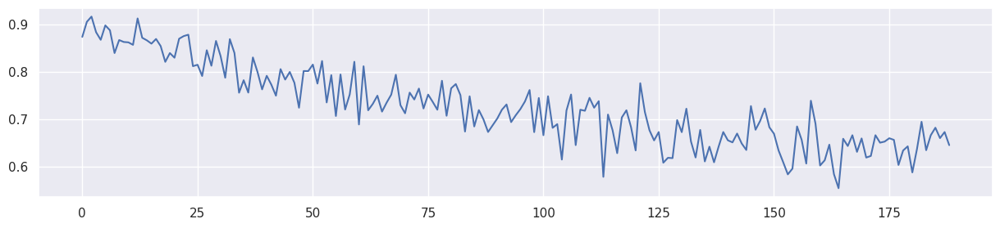

Mean F1 for all data: 0.7273640477524118
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: -0.000846] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: -0.279464] [G loss: 0.683853]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: -0.261531] [G loss: 0.675061]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: -0.269593] [G loss: 0.662063]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: -0.225906] [G loss: 0.642594]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: -0.271230] [G loss: 0.620706]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: -0.256004] [G loss: 0.597228]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: -0.283201] [G loss: 0.572817]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: -0.269446] [G loss: 0.549031]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: -0.195605] [G loss: 0.525873]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: -0.260621] [G loss: 0.503849]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: -0.243448] [G loss: 0.483444]
[Lambda: 0.500000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 501.22it/s]


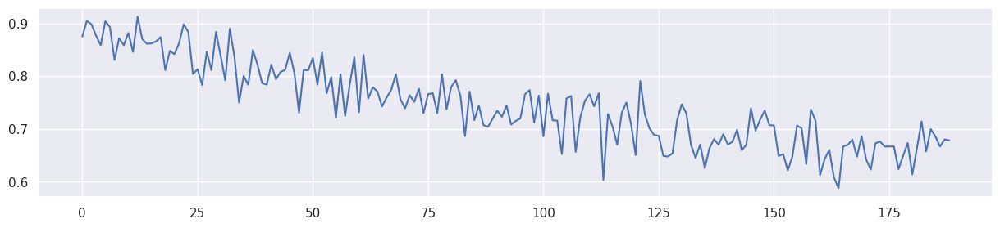

Mean F1 for all data: 0.7450142212010992
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: -0.000558] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: -0.234669] [G loss: 0.684508]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: -0.262255] [G loss: 0.678233]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: -0.267029] [G loss: 0.671081]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: -0.270737] [G loss: 0.662621]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: -0.260307] [G loss: 0.651939]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: -0.230366] [G loss: 0.638153]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: -0.302024] [G loss: 0.620574]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: -0.279894] [G loss: 0.601198]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: -0.241166] [G loss: 0.581367]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: -0.308857] [G loss: 0.562126]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: -0.271522] [G loss: 0.544047]
[Lambda: 0.600000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 526.40it/s]


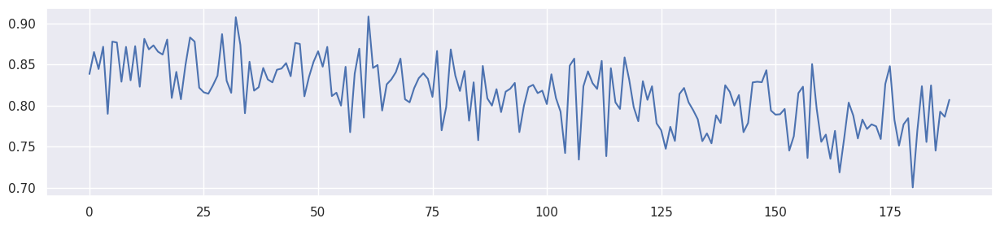

Mean F1 for all data: 0.8149253192693741
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: -0.000891] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: -0.269537] [G loss: 0.685338]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: -0.256177] [G loss: 0.681541]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: -0.293229] [G loss: 0.677454]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: -0.265150] [G loss: 0.673170]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: -0.228792] [G loss: 0.667747]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: -0.273788] [G loss: 0.661651]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: -0.232903] [G loss: 0.654481]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: -0.221953] [G loss: 0.646230]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: -0.221628] [G loss: 0.636609]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: -0.308571] [G loss: 0.625107]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: -0.248238] [G loss: 0.611436]
[Lambda: 0.700000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 531.99it/s]


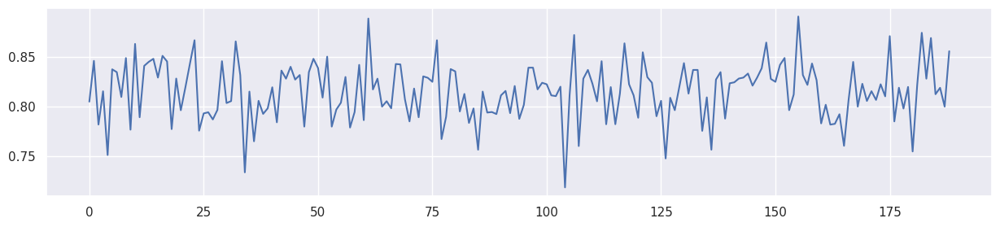

Mean F1 for all data: 0.8152230980740456
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: -0.000439] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: -0.287137] [G loss: 0.686119]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: -0.252841] [G loss: 0.684505]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: -0.257898] [G loss: 0.682633]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: -0.239705] [G loss: 0.680894]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: -0.244609] [G loss: 0.678533]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: -0.222594] [G loss: 0.676112]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: -0.253021] [G loss: 0.674188]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: -0.224870] [G loss: 0.671679]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: -0.286239] [G loss: 0.668694]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: -0.312634] [G loss: 0.665344]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: -0.262243] [G loss: 0.661565]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 520.30it/s]


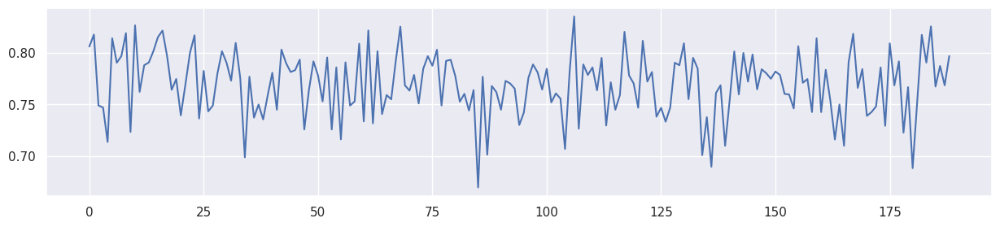

Mean F1 for all data: 0.7693500020813949
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: -0.000790] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: -0.236882] [G loss: 0.687225]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: -0.263891] [G loss: 0.687018]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: -0.273625] [G loss: 0.687062]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: -0.221410] [G loss: 0.686692]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: -0.274282] [G loss: 0.686296]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: -0.223903] [G loss: 0.686400]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: -0.263889] [G loss: 0.686149]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: -0.260655] [G loss: 0.686499]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: -0.242193] [G loss: 0.685943]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: -0.243541] [G loss: 0.685844]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: -0.207578] [G loss: 0.685581]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 450.43it/s]


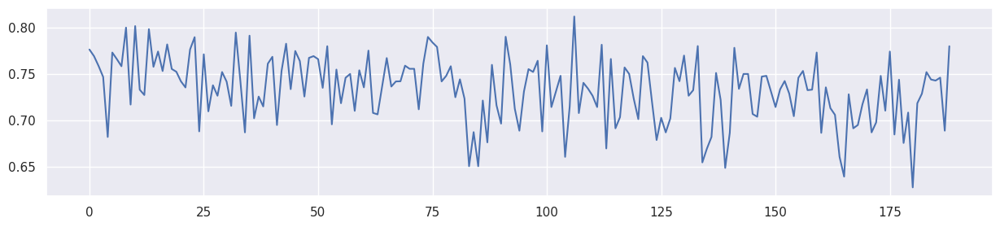

Mean F1 for all data: 0.7336693601508723


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


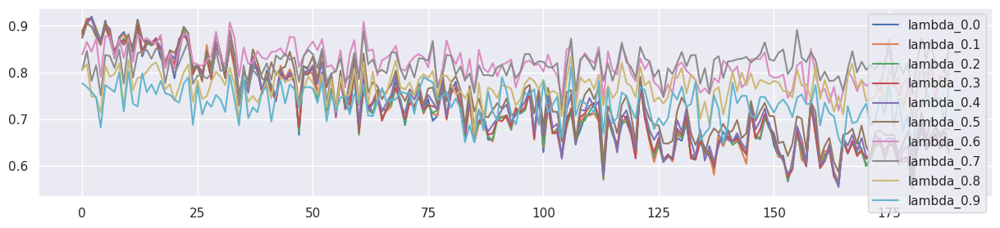

In [38]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model4(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed,alpha=1.2)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



# GAN 기반의 RF-Train이 아닌, G(Z,B) 모델에서 전처리 학습 방법 적용
+ GAN 기번의 RF-Train 응용 방법은 일종의 orver-fitting을 막는 방법론에 해당한다.
+ 즉, trainset의 z에 over-fitting되어 이후 live data에 대해 성능이 저하되는 현상을 막도록하는 방법이다.
+ 따라서 이 방법은 결정적으로 test_f1 및 init_f1을 낮게 (z를 포함한 모든 feature을 학습하는 일반적인 학습방법에 비하여) 하는 결점을 갖는다.
+ 그렇다면, 이를 극복하며 live data의 성능도 떨어지지 않게 하는 방법은 무엇인가?
+ 본 chapter에서는 G(Z,B)를 입력으로 갖는 구조. 즉, bucket number와 z의 관계를 학습하여 전처리의 개념으로 새로 생성된 g를 z에 대신하여 D(x,g)에 입력하여 학습하는 모델을 제안한다.

## D(x,G(z,b)) 구조


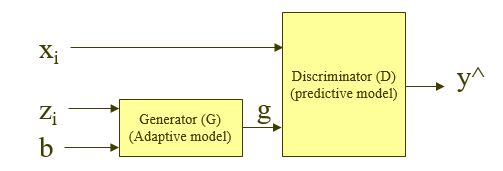

<pre>
x0 -------------------------------------> |                        |
x1 -------------------------------------> |                        |
x2 -------------------------------------> | Discriminator (D(x,g)) | -> y^
x3 -------------------------------------> | predictive model       |
z0 ------>| Generator (G(z,b)) | -- g --> |                        |
b  ------>| adaptive model     |
</pre>

+ 상기 구조의 loss function

$$
L_1 = H(y,\hat{y}) = H(y,D(x,G(z,b)))=\mathbb{E}_{y}[-log(D(x,G(z,b)))]
$$

$$
L_2 = MSE(G(z,b),z)
$$

$$
\min_{G(.)} (1-λ) L_1 + λ L_2
$$


+ 위의 loss function에서, lambda가 0이면 $L_1$의 backward 에서 D를 거쳐 G까지 학습이 이루어 진다. 
+ lambda가 0~1 사이의 값인 경우, G의 생성이 b의 값을 무시하는 방향으로 학습된다. 즉, feature 5개 입력의 특성에 근접, 다시말해 over-fitting의 효과로 학습된다.

In [39]:
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


In [40]:
mi_scores = make_mi_scores(X[['x0','x1','x2','x3','z0']], X['b'], discrete_features="auto")
print(mi_scores)

z0    0.163087
x0    0.000000
x1    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64


+ I(Z,B) 만 0.16의 수치가 나오는 것을 확인 할 수 있음!!!!
+ 즉, Z는 시간에 따라 importance가 변하고 있음.... -> Concept drift의 발생 요소  

In [41]:
# 학습셋에서의 I(Z,B)

mi_scores = make_mi_scores(X[0:2000][['x0','x1','x2','x3','z0']], X[0:2000]['b'], discrete_features="auto")
print(mi_scores)

x3    0.020639
x2    0.010275
x0    0.000000
x1    0.000000
z0    0.000000
Name: MI Scores, dtype: float64


+ 감지 안됨!!!!

(40000, 5)
(40000,)


100%|██████████| 5000/5000 [00:09<00:00, 519.97it/s]



0.006095558


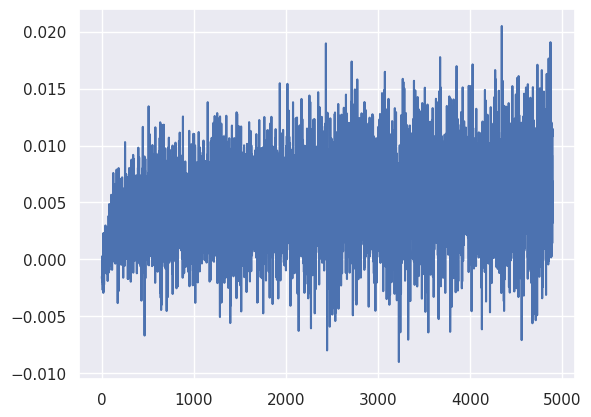

In [42]:
from tqdm import tqdm

H=20
n_epoch = 5000
minibatch = 1000

x1 = X[0:2000][['z0']].values
y1 = X[0:2000][['b']].values #y_train.data.numpy()

#x1 = X[['z0']].values
#y1 = X[['b']].values #y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss[100:])
print(np.mean(plot_loss[4000:]))

+ 유의미하게 감지되지 않음.....
+ 잘 안될거 같은데...

In [43]:
avaible_range = 400

In [65]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 15),
            nn.ReLU(),
            nn.Linear(15, 5),
            nn.ReLU(),
            nn.Linear(5, 1)          
        )

    def forward(self, z0,b):

        adjusted_z = self.model(torch.cat((z0,b), 1))
        return adjusted_z

In [45]:

def test_model2(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    a_z = model2_(tX[:,4].reshape(-1,1),tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(torch.cat((tX[:,0:4],a_z.reshape(-1,1)),1))
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [46]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model5(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        '''
        s = np.random.choice(XS_train.shape[0],minibatch)

        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = XS_train[s][:,5].reshape(-1,1) # bucket number.. B
        y_shuffle = XS_train[np.random.permutation(s)][:,5].reshape(-1,1) #permute bucket number.. B
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        ibz = torch.full((XS_train.shape[0],1), ret1.data.numpy())
        '''
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [47]:
def test_all_data3(generator,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            #xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)).reshape(-1,1)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

In [48]:
def test_all_data2(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 154.037689] [G loss: 0.662213]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 281.415802] [G loss: 0.569898]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 321.137909] [G loss: 0.513112]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 383.931793] [G loss: 0.471092]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 434.896973] [G loss: 0.435973]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 441.853363] [G loss: 0.405463]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 413.453339] [G loss: 0.377529]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 349.614899] [G loss: 0.350684]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 265.492004] [G loss: 0.322746]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 200.580063] [G loss: 0.294826]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 163.095947] [G loss: 0.271778]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 135.547653] [G loss: 0.2

100%|██████████| 189/189 [00:00<00:00, 455.75it/s]


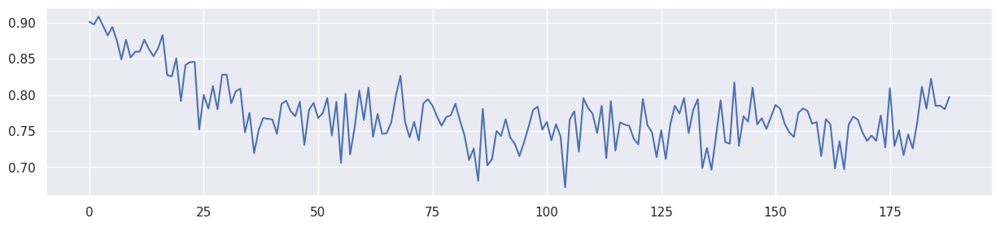

Mean F1 for all data: 0.7738643195496555
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 126.916336] [G loss: 0.659001]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 259.658936] [G loss: 0.565477]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 295.239990] [G loss: 0.510204]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 318.317902] [G loss: 0.469357]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 321.299438] [G loss: 0.432951]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 286.264709] [G loss: 0.398794]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 243.107315] [G loss: 0.367163]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 194.476944] [G loss: 0.335919]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 150.766998] [G loss: 0.305874]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 124.739326] [G loss: 0.279868]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 104.458473] [G loss: 0.261220]
[Lambda: 0.100000] [Epoch 2400

100%|██████████| 189/189 [00:00<00:00, 461.91it/s]


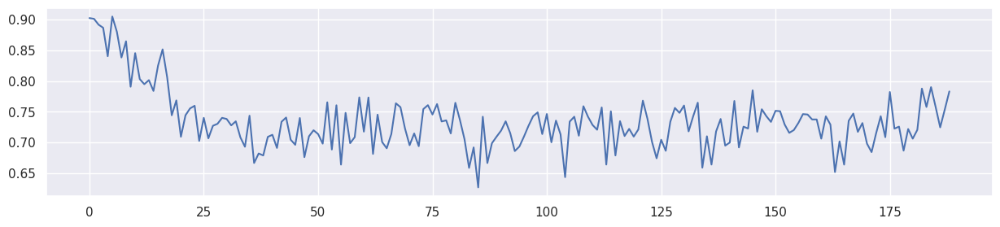

Mean F1 for all data: 0.7347420472958491
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 108.285904] [G loss: 0.662244]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 234.075531] [G loss: 0.568086]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 255.074463] [G loss: 0.513125]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 270.531189] [G loss: 0.472103]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 258.772888] [G loss: 0.436353]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 229.438416] [G loss: 0.403128]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 194.913727] [G loss: 0.370394]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 162.840378] [G loss: 0.339212]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 123.938011] [G loss: 0.310835]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 104.647003] [G loss: 0.282831]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 94.973984] [G loss: 0.263312]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 460.87it/s]


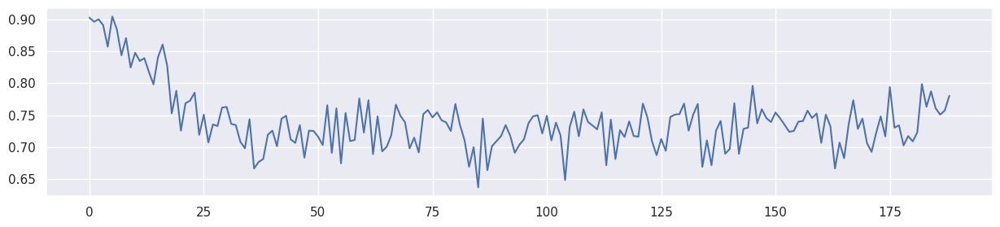

Mean F1 for all data: 0.7410673464686434
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 108.121994] [G loss: 0.662616]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 244.114838] [G loss: 0.563366]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 252.043503] [G loss: 0.512902]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 245.416245] [G loss: 0.473918]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 225.831116] [G loss: 0.437307]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 197.901138] [G loss: 0.402290]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 157.293121] [G loss: 0.368640]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 136.774368] [G loss: 0.335094]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 112.889534] [G loss: 0.305705]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 97.395645] [G loss: 0.279212]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 89.191147] [G loss: 0.260397]
[Lambda: 0.300000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 466.06it/s]


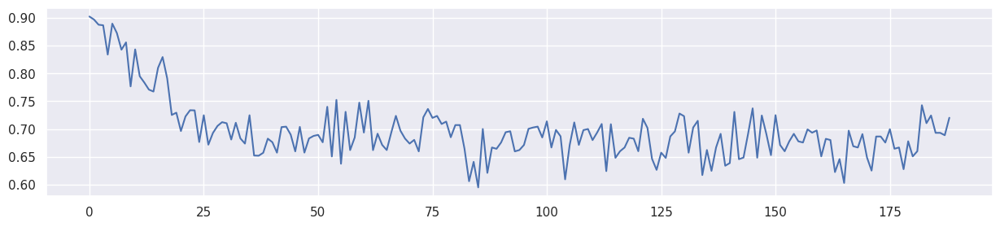

Mean F1 for all data: 0.6975126417857895
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 105.021851] [G loss: 0.663811]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 223.375244] [G loss: 0.566038]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 227.881287] [G loss: 0.514031]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 214.097229] [G loss: 0.475274]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 192.460724] [G loss: 0.437941]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 167.756851] [G loss: 0.401367]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 141.188110] [G loss: 0.365626]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 124.078232] [G loss: 0.332312]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 102.023239] [G loss: 0.301646]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 88.025818] [G loss: 0.275780]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 79.492737] [G loss: 0.256033]
[Lambda: 0.400000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 478.11it/s]


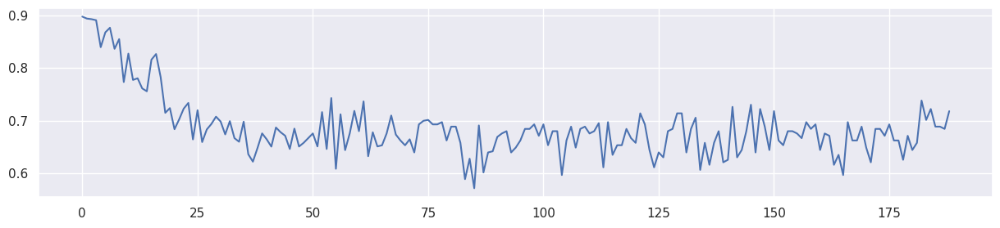

Mean F1 for all data: 0.6860201695313962
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 99.148613] [G loss: 0.665537]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 202.728561] [G loss: 0.570021]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 205.899414] [G loss: 0.515912]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 188.827408] [G loss: 0.476854]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.103409] [G loss: 0.439049]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 145.082642] [G loss: 0.400600]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 126.442772] [G loss: 0.363785]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 103.596825] [G loss: 0.330143]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 88.724205] [G loss: 0.297179]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 81.772102] [G loss: 0.270977]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 77.290268] [G loss: 0.253241]
[Lambda: 0.500000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 477.43it/s]


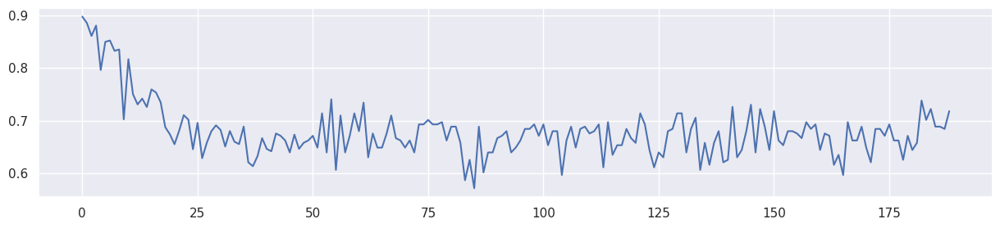

Mean F1 for all data: 0.6799849308770951
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 101.285828] [G loss: 0.664391]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 178.838867] [G loss: 0.573957]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 186.534378] [G loss: 0.518391]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 166.889648] [G loss: 0.479015]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 146.962677] [G loss: 0.440100]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 128.200195] [G loss: 0.400930]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 109.966675] [G loss: 0.363675]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 93.576477] [G loss: 0.327156]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.482407] [G loss: 0.294024]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 78.573921] [G loss: 0.269711]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 75.221497] [G loss: 0.252516]
[Lambda: 0.600000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 478.43it/s]


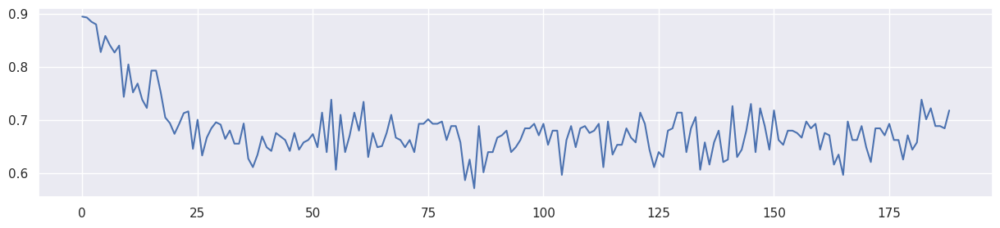

Mean F1 for all data: 0.6818721050097151
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 97.936012] [G loss: 0.665851]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 157.722366] [G loss: 0.581276]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 163.057205] [G loss: 0.523552]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.184631] [G loss: 0.481929]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 126.491669] [G loss: 0.439617]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 110.576286] [G loss: 0.395994]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 96.448784] [G loss: 0.352780]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 87.416374] [G loss: 0.312755]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 81.309502] [G loss: 0.280496]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 77.401390] [G loss: 0.257589]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 74.851242] [G loss: 0.242487]
[Lambda: 0.700000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 440.03it/s]


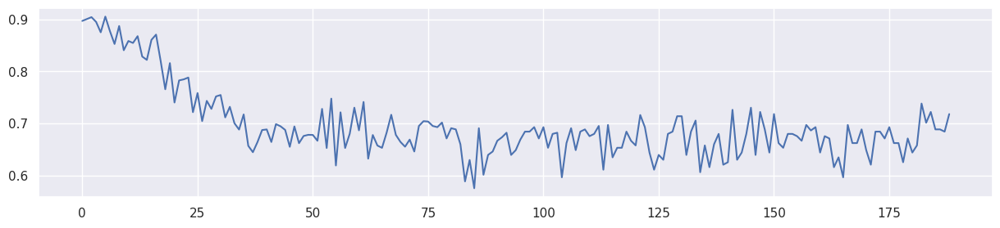

Mean F1 for all data: 0.6963764708294092
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 94.237000] [G loss: 0.668296]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 124.120132] [G loss: 0.603298]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 133.185120] [G loss: 0.536262]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 122.394821] [G loss: 0.482880]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 109.776855] [G loss: 0.431639]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 97.653801] [G loss: 0.382320]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 88.429306] [G loss: 0.335515]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 82.239655] [G loss: 0.296459]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 77.681473] [G loss: 0.268433]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 74.324593] [G loss: 0.249355]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 72.182449] [G loss: 0.237763]
[Lambda: 0.800000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 458.09it/s]


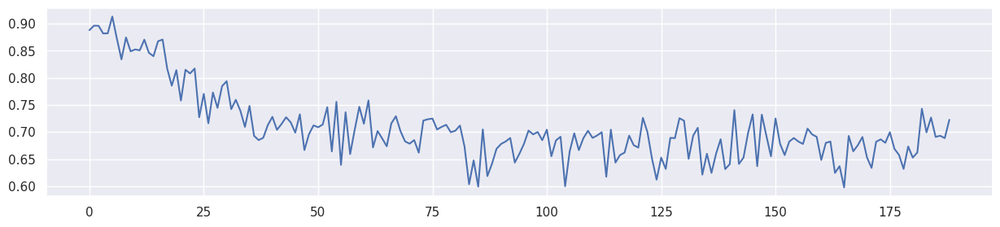

Mean F1 for all data: 0.7087330739533028
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 103.415932] [G loss: 0.686682]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 93.008713] [G loss: 0.669598]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 91.836311] [G loss: 0.640884]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 99.293159] [G loss: 0.580166]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 101.932243] [G loss: 0.500009]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 96.323700] [G loss: 0.434685]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 89.334259] [G loss: 0.377883]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 83.621681] [G loss: 0.328654]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 79.373596] [G loss: 0.290559]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 75.947525] [G loss: 0.264501]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 73.764969] [G loss: 0.247427]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 71.545830] [G loss: 0.237561]
[Lambda: 0.900000] [Epoch 2400/4000] [mi

100%|██████████| 189/189 [00:00<00:00, 464.18it/s]


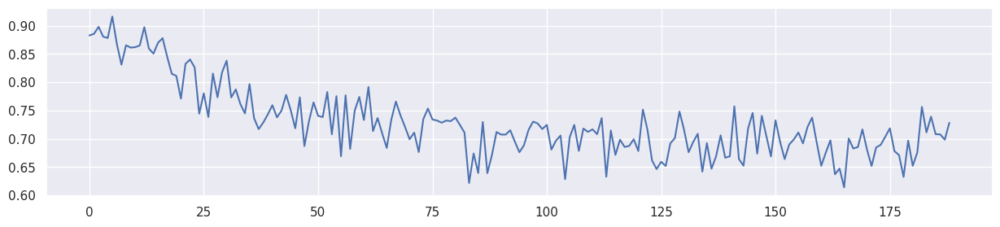

Mean F1 for all data: 0.7293076036997593


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


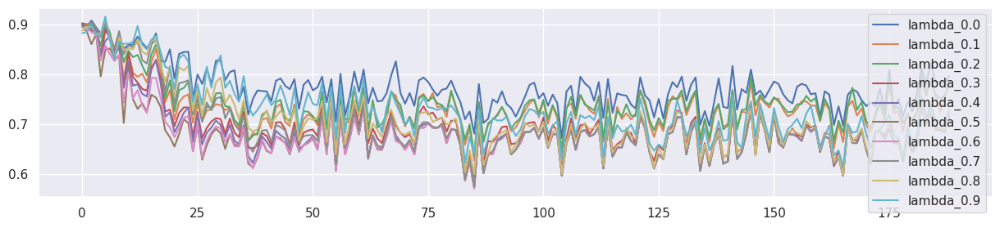

In [49]:
seed_everything()

train_result = []

avaible_range = 1

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ bucket number를 normalize하면 모델의 유효기간을 설정할 수 있다.
+ 즉, 유효기간까지는 model의 성능을 보전 시킬 수 있는 개념
+ 상기 모든 처리를 그대로 두고 bucket number를 normalize 하여 실험 한다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 108.244400] [G loss: 0.663271]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 231.880386] [G loss: 0.572146]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 270.650635] [G loss: 0.512678]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 316.379883] [G loss: 0.471908]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 347.266418] [G loss: 0.436837]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 345.882141] [G loss: 0.405478]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 316.615387] [G loss: 0.375414]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 284.888916] [G loss: 0.344750]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 223.208267] [G loss: 0.316410]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 199.365631] [G loss: 0.291299]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 176.872253] [G loss: 0.271652]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 167.569931] [G loss: 0.25

100%|██████████| 189/189 [00:00<00:00, 457.64it/s]


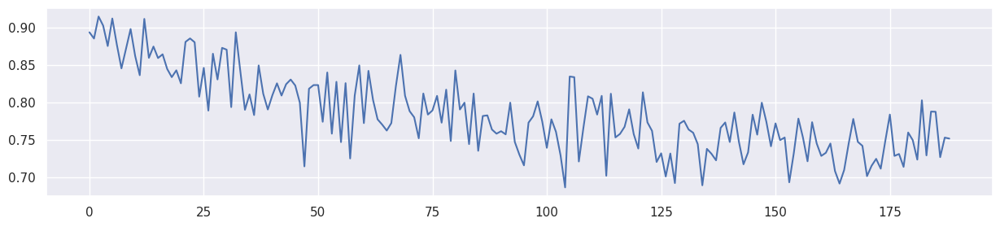

Mean F1 for all data: 0.7853060386139337
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 105.813400] [G loss: 0.663555]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 224.948822] [G loss: 0.571824]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 261.543884] [G loss: 0.512670]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 286.739136] [G loss: 0.472426]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 294.137085] [G loss: 0.435931]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 279.201019] [G loss: 0.377399]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 237.905670] [G loss: 0.346154]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 177.756393] [G loss: 0.316419]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 142.437805] [G loss: 0.290156]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 124.242233] [G loss: 0.271096]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 108.133148] [G loss: 0.257668]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 476.90it/s]


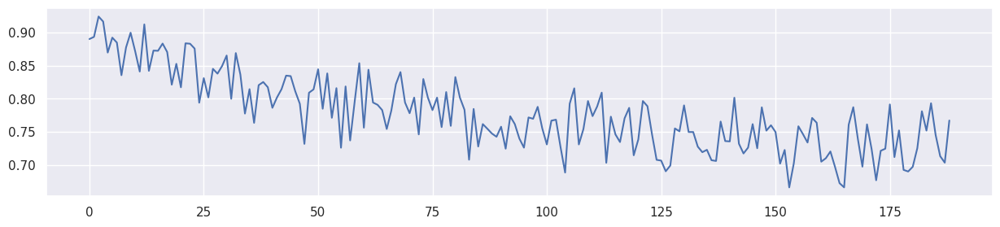

Mean F1 for all data: 0.7779965023556672
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 103.189285] [G loss: 0.664038]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 217.672775] [G loss: 0.572550]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 245.310974] [G loss: 0.513011]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 256.935577] [G loss: 0.473013]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 248.161438] [G loss: 0.436858]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 225.148071] [G loss: 0.402544]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 198.392807] [G loss: 0.369741]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 162.469498] [G loss: 0.338197]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 139.740799] [G loss: 0.308192]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 122.859528] [G loss: 0.284056]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 111.243736] [G loss: 0.265368]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 476.90it/s]


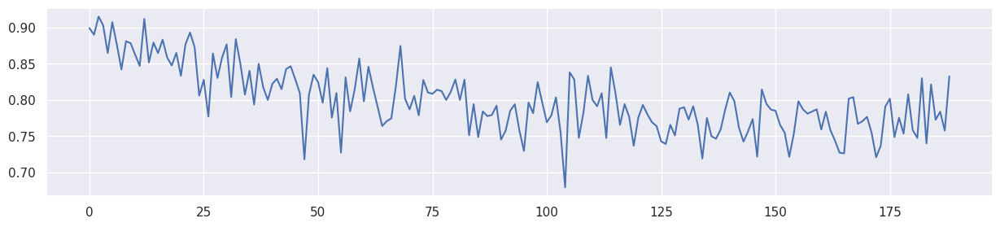

Mean F1 for all data: 0.7996114451872898
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 101.657425] [G loss: 0.664655]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 208.767776] [G loss: 0.573653]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 232.385101] [G loss: 0.513578]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 232.131592] [G loss: 0.473925]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 215.264359] [G loss: 0.437577]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 196.017654] [G loss: 0.402053]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 164.935150] [G loss: 0.368643]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 140.873444] [G loss: 0.336316]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 121.630600] [G loss: 0.306369]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 109.795486] [G loss: 0.281916]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 102.008141] [G loss: 0.263823]
[Lambda: 0.300000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 479.60it/s]


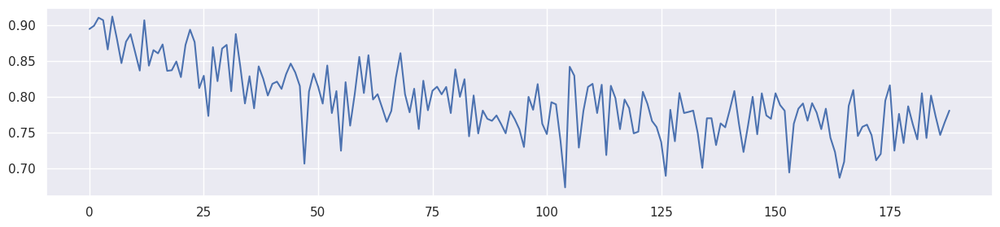

Mean F1 for all data: 0.7943671386825094
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 99.891266] [G loss: 0.665491]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 197.111649] [G loss: 0.575976]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 214.379745] [G loss: 0.514758]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 206.959213] [G loss: 0.475247]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 187.698059] [G loss: 0.439259]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 162.386749] [G loss: 0.403372]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 136.885178] [G loss: 0.368117]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 119.331062] [G loss: 0.334943]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 99.533104] [G loss: 0.304882]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 83.179337] [G loss: 0.277121]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 74.947945] [G loss: 0.254990]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 468.28it/s]


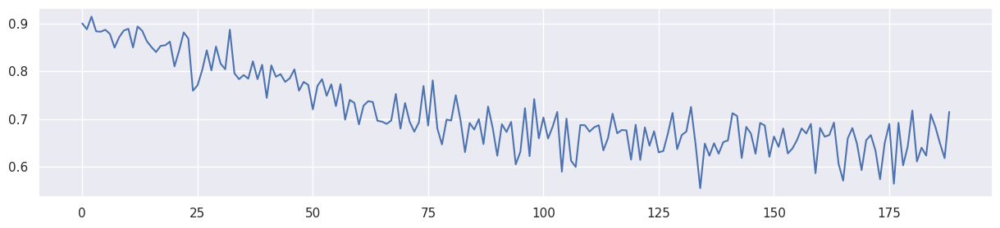

Mean F1 for all data: 0.715395417623194
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 97.799950] [G loss: 0.666547]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 182.029404] [G loss: 0.579117]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 200.113068] [G loss: 0.516255]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 187.802826] [G loss: 0.477126]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.808670] [G loss: 0.439312]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 145.759277] [G loss: 0.401667]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 127.314621] [G loss: 0.365520]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 109.204277] [G loss: 0.332295]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 94.440926] [G loss: 0.300724]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 83.745018] [G loss: 0.274687]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 77.949234] [G loss: 0.256346]
[Lambda: 0.500000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 483.08it/s]


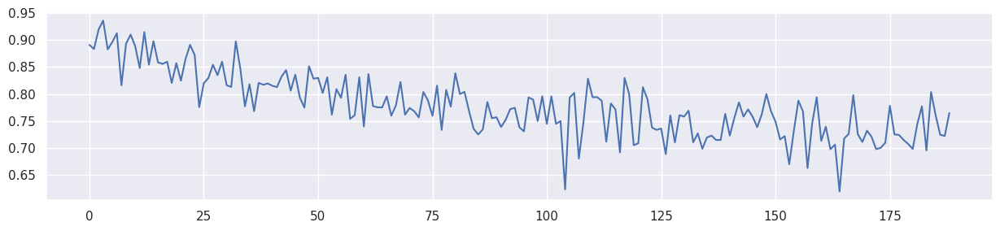

Mean F1 for all data: 0.7795006275009116
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 95.722610] [G loss: 0.667992]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 160.898544] [G loss: 0.591472]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 182.388687] [G loss: 0.520478]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 164.328430] [G loss: 0.480444]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 143.219055] [G loss: 0.441840]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 125.459663] [G loss: 0.401110]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 105.644196] [G loss: 0.362287]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 92.312447] [G loss: 0.323869]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.127335] [G loss: 0.290019]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 77.744331] [G loss: 0.265383]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 74.104355] [G loss: 0.248066]
[Lambda: 0.600000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 465.94it/s]


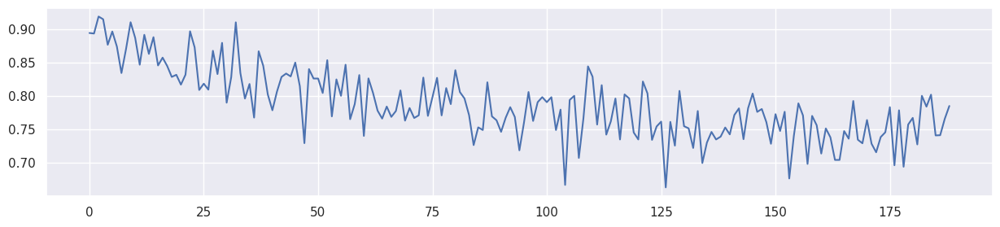

Mean F1 for all data: 0.787695121051676
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.923409] [G loss: 0.669354]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 139.335175] [G loss: 0.605831]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 164.897507] [G loss: 0.528624]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.504639] [G loss: 0.484545]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.497017] [G loss: 0.441017]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.941650] [G loss: 0.396774]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.801865] [G loss: 0.352502]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.822624] [G loss: 0.311348]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.060005] [G loss: 0.278741]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.388870] [G loss: 0.255982]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.070229] [G loss: 0.242007]
[Lambda: 0.700000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 435.01it/s]


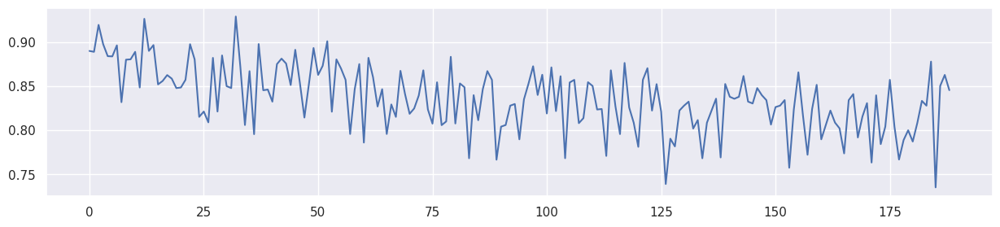

Mean F1 for all data: 0.8365893752928024
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 92.723732] [G loss: 0.670305]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 89.146736] [G loss: 0.646817]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 85.496346] [G loss: 0.616317]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 81.624825] [G loss: 0.576955]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 77.461494] [G loss: 0.526442]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 73.327560] [G loss: 0.469273]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 69.669044] [G loss: 0.416513]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 66.686401] [G loss: 0.376127]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 64.370438] [G loss: 0.350361]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 62.601749] [G loss: 0.336251]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 61.197266] [G loss: 0.329088]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 475.30it/s]


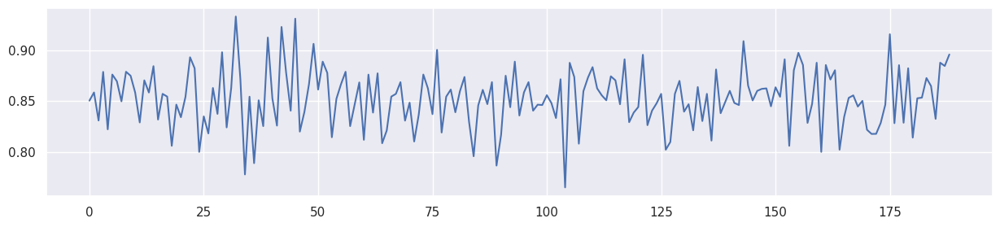

Mean F1 for all data: 0.8528047633954339
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 70.039795] [G loss: 0.675442]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 32.512520] [G loss: 0.643272]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 30.626003] [G loss: 0.611397]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.139454] [G loss: 0.541499]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 41.323776] [G loss: 0.347803]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 38.690685] [G loss: 0.289876]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 35.413010] [G loss: 0.264157]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 33.383438] [G loss: 0.249864]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 32.064739] [G loss: 0.241453]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 31.238050] [G loss: 0.235852]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 30.657854] [G loss: 0.232435]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 464.44it/s]


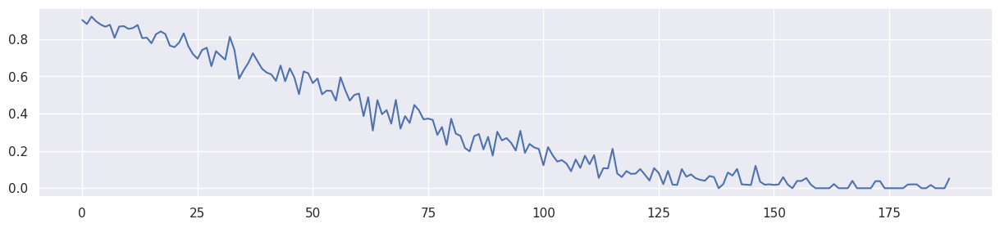

Mean F1 for all data: 0.31769775200264727


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


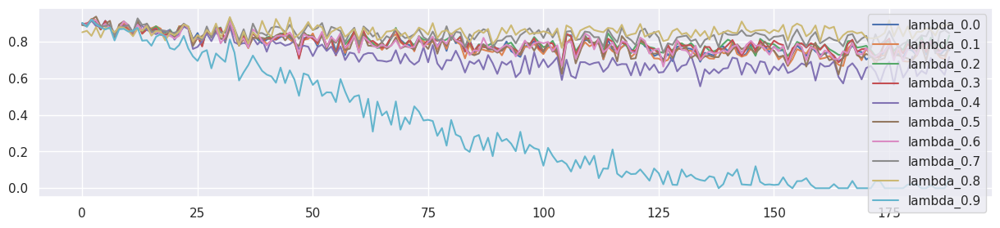

In [50]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ lambda 0.4 에서, I(z,b)와 I(g,b)를 비교하기

In [51]:
def test_all_data5(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    gs = torch.tensor([])
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            gs = torch.cat((gs,xs),0)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s,gs

[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.923409] [G loss: 0.669354]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 139.335175] [G loss: 0.605831]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 164.897507] [G loss: 0.528624]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.504639] [G loss: 0.484545]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.497017] [G loss: 0.441017]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.941650] [G loss: 0.396774]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.801865] [G loss: 0.352502]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.822624] [G loss: 0.311348]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.060005] [G loss: 0.278741]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.388870] [G loss: 0.255982]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.070229] [G loss: 0.242007]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 71.401993] [G loss: 0.234141]
[

100%|██████████| 190/190 [00:00<00:00, 476.09it/s]


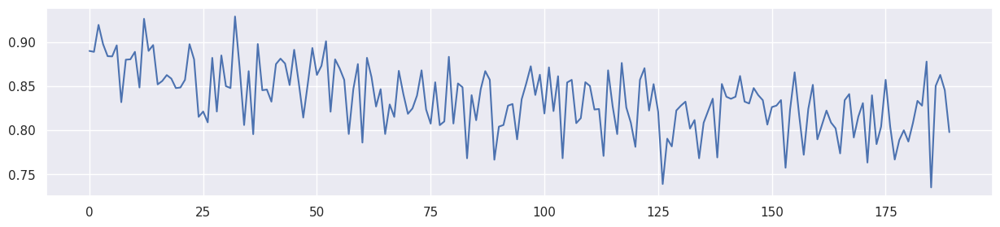

Mean F1 for all data: 0.8363856014250799
gs.shape torch.Size([38000, 1])
I(z,b) b     5.932748
z0    0.140249
x1    0.000640
x0    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64
I(g,b) 0.355607120704172


In [52]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.7]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'],gs = test_all_data5(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

print('gs.shape',gs.shape)
mi_scores = make_mi_scores(X[2000:], X[2000:]['b'], discrete_features="auto")
print('I(z,b)',mi_scores)
mi_scores = make_mi_scores(pd.DataFrame(gs.data.numpy(),columns=['g']), X[2000:]['b'], discrete_features="auto")
print('I(g,b)',mi_scores['g'])



# D(x,G(z,b)) + MINE 구조

+ D(x,G(z,b)) 구조에서 보면, I(z,y), I(g,y) 를 최대로 만들때 성능이 향상됨을 확인 함.
+ 이는 I(z,y^)을 최소화 해서 over-fitting 을 막는 것이 아닌, b와의 관계성을 더 증폭시켜서 b에 적응한 학습을 하게하는 효과라고 해석함.
+ 따라서, 학습 알고리즘 상에서 I(z,y) 또는 I(g,y) 를 최대로

In [90]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model55(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        '''
        s = np.random.choice(XS_train.shape[0],minibatch)

        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = XS_train[s][:,5].reshape(-1,1) # bucket number.. B
        y_shuffle = XS_train[np.random.permutation(s)][:,5].reshape(-1,1) #permute bucket number.. B
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        ibz = torch.full((XS_train.shape[0],1), ret1.data.numpy())
        '''
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  I(g,y)의 MINE loss
        # -------------------------------
        
        s = np.random.choice(XS_train.shape[0],minibatch)

        #x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        x_sample = a_z[s] #Variable(torch.from_numpy(a_z[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        #y_sample = gen_y[s]
        #y_shuffle = gen_y[np.random.permutation(s)]
        y_sample = y_train[s].reshape(-1,1)
        y_shuffle = y_train[np.random.permutation(s)].reshape(-1,1)
        #y_sample = XS_train[s,5].reshape(-1,1)
        #y_shuffle = XS_train[np.random.permutation(s),5].reshape(-1,1)
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        optimizer_A.zero_grad()
        optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha + mi_loss * lambda_a2 #* 0.05

        loss.backward()
        optimizer_G.step()
        optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 108.243469] [G loss: 0.663266]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 231.870041] [G loss: 0.572151]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 270.672302] [G loss: 0.512675]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 316.409607] [G loss: 0.471911]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 347.274445] [G loss: 0.436847]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 345.299042] [G loss: 0.405475]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 320.325378] [G loss: 0.375550]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 287.074738] [G loss: 0.345150]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 221.670212] [G loss: 0.316429]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 197.583176] [G loss: 0.291468]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 178.012314] [G loss: 0.271783]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 166.535049] [G loss: 0.25

100%|██████████| 189/189 [00:00<00:00, 438.89it/s]


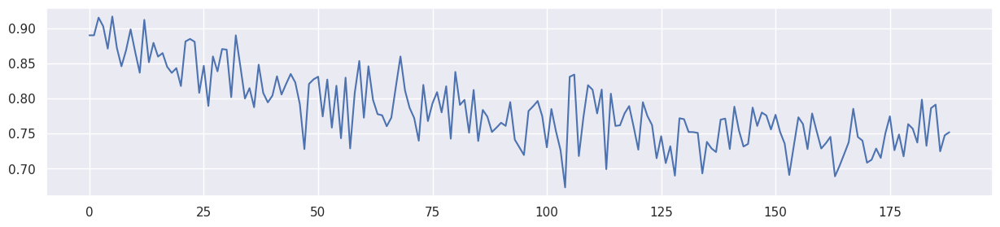

Mean F1 for all data: 0.7852582250279345
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 105.814392] [G loss: 0.663549]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 224.928421] [G loss: 0.571840]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 261.519714] [G loss: 0.512675]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 286.878845] [G loss: 0.472422]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 294.272156] [G loss: 0.436292]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 278.839142] [G loss: 0.378156]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 237.569382] [G loss: 0.346213]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 177.499985] [G loss: 0.316487]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 142.643677] [G loss: 0.290194]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 124.330345] [G loss: 0.271121]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 107.742584] [G loss: 0.257615]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 480.11it/s]


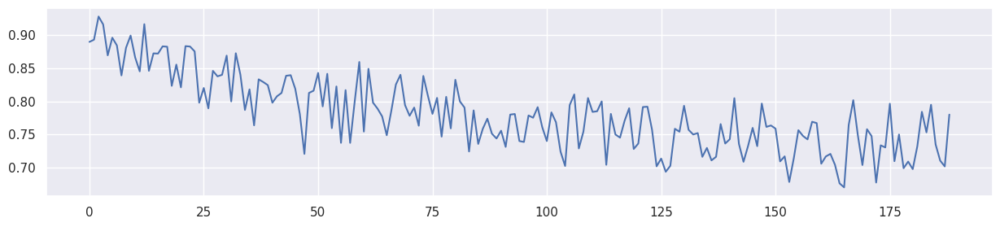

Mean F1 for all data: 0.7810566458741384
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 103.205383] [G loss: 0.664027]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 217.688354] [G loss: 0.572565]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 245.303131] [G loss: 0.513014]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 256.843628] [G loss: 0.473018]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 248.694794] [G loss: 0.436821]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 225.137512] [G loss: 0.402539]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 195.974182] [G loss: 0.369750]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 160.932480] [G loss: 0.338081]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 139.255829] [G loss: 0.308085]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 122.439774] [G loss: 0.283950]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 109.896675] [G loss: 0.265070]
[Lambda: 0.200000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 466.76it/s]


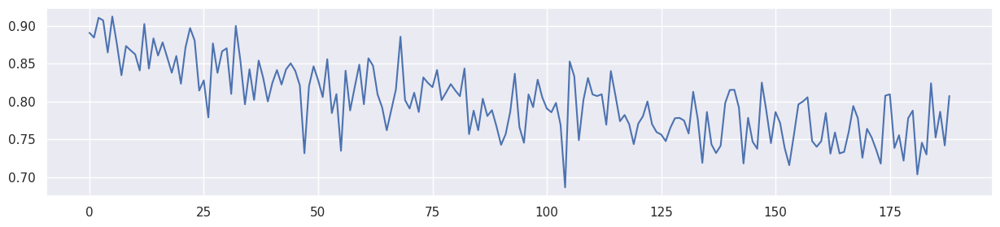

Mean F1 for all data: 0.8005381734004499
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 101.686447] [G loss: 0.664638]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 208.780396] [G loss: 0.573662]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 232.347794] [G loss: 0.513583]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 231.895615] [G loss: 0.473936]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 215.124771] [G loss: 0.437618]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 196.135849] [G loss: 0.402048]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 164.889526] [G loss: 0.368641]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 141.136078] [G loss: 0.336279]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 121.757431] [G loss: 0.306362]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 109.839378] [G loss: 0.281951]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 101.871353] [G loss: 0.263765]
[Lambda: 0.300000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 465.71it/s]


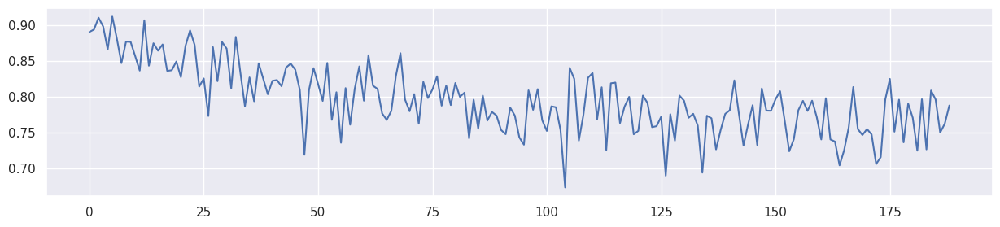

Mean F1 for all data: 0.7958414445045614
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 99.925293] [G loss: 0.665471]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 197.094788] [G loss: 0.575992]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 214.464539] [G loss: 0.514752]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 207.207809] [G loss: 0.475240]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 187.661087] [G loss: 0.439260]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 162.376282] [G loss: 0.403372]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 136.959671] [G loss: 0.368106]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 119.339043] [G loss: 0.334939]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 99.670967] [G loss: 0.304872]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 83.210228] [G loss: 0.277146]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 74.916023] [G loss: 0.255035]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 467.78it/s]


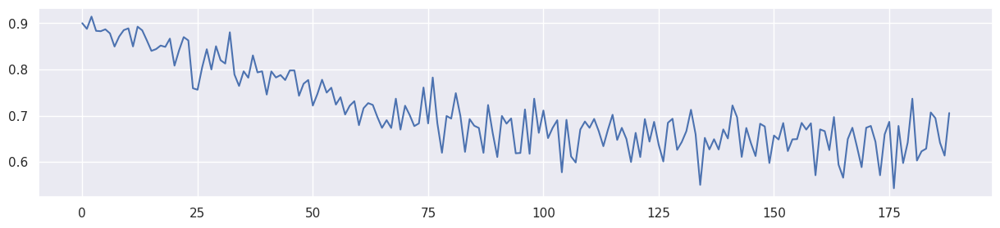

Mean F1 for all data: 0.7106691819022144
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 97.844116] [G loss: 0.666519]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 181.975357] [G loss: 0.579144]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 200.117142] [G loss: 0.516256]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 187.627884] [G loss: 0.477188]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.835663] [G loss: 0.439344]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 145.987900] [G loss: 0.401604]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 127.100487] [G loss: 0.365727]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 109.429291] [G loss: 0.332617]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 95.805519] [G loss: 0.300883]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 83.954597] [G loss: 0.274974]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 78.173271] [G loss: 0.256546]
[Lambda: 0.500000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 416.43it/s]


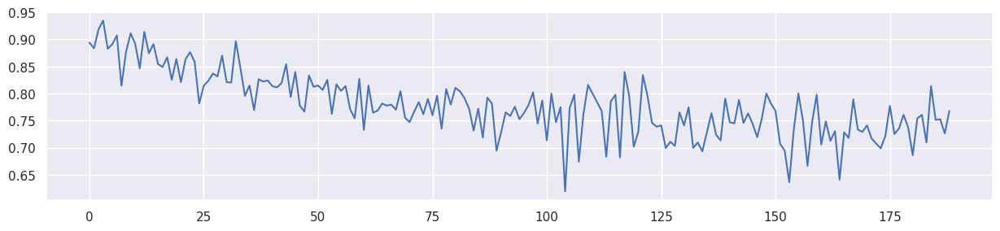

Mean F1 for all data: 0.7789460759734712
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 95.787361] [G loss: 0.667946]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 160.914368] [G loss: 0.591425]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 182.286560] [G loss: 0.520483]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 164.394913] [G loss: 0.480413]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 143.110123] [G loss: 0.441889]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 123.718582] [G loss: 0.402383]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 104.796120] [G loss: 0.362475]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 91.641808] [G loss: 0.323844]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 83.055252] [G loss: 0.289806]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 77.688713] [G loss: 0.265305]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 74.088593] [G loss: 0.248028]
[Lambda: 0.600000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 450.62it/s]


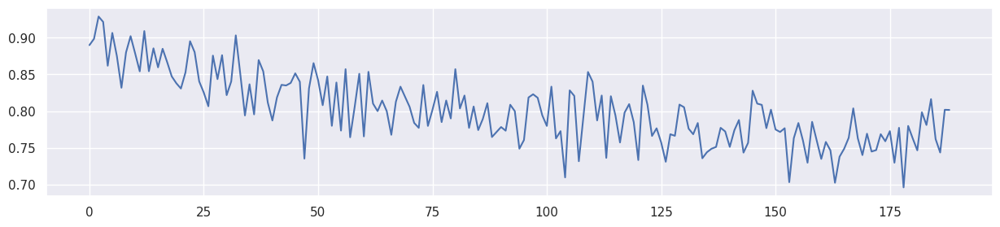

Mean F1 for all data: 0.8021936605392318
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 94.265358] [G loss: 0.669189]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 139.111740] [G loss: 0.605862]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 164.924545] [G loss: 0.528511]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.040176] [G loss: 0.484643]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.588562] [G loss: 0.440900]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.829788] [G loss: 0.396746]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.790916] [G loss: 0.352445]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.824539] [G loss: 0.311291]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.056084] [G loss: 0.278709]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.399361] [G loss: 0.255944]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.075645] [G loss: 0.241972]
[Lambda: 0.700000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 445.90it/s]


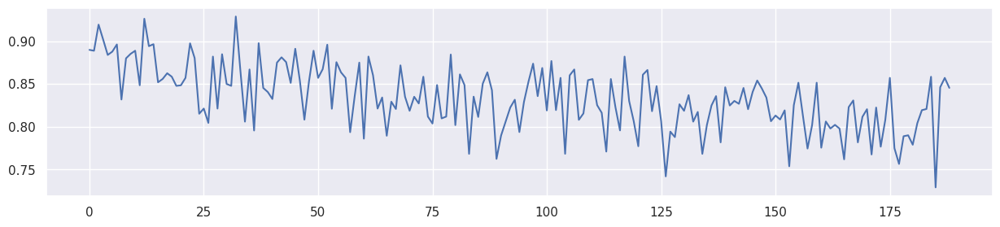

Mean F1 for all data: 0.8339661800295444
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 92.723732] [G loss: 0.670305]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 89.146683] [G loss: 0.646817]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 85.496353] [G loss: 0.616317]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 81.624825] [G loss: 0.576955]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 77.461525] [G loss: 0.526442]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 73.327538] [G loss: 0.469273]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 69.669014] [G loss: 0.416513]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 66.686401] [G loss: 0.376128]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 64.370407] [G loss: 0.350361]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 62.601711] [G loss: 0.336252]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 61.197227] [G loss: 0.329088]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 461.95it/s]


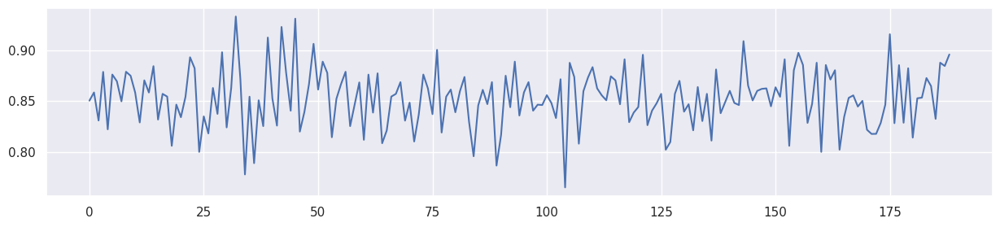

Mean F1 for all data: 0.8528047633954339
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 96.879539] [G loss: 0.687072]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 70.149185] [G loss: 0.675417]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 32.504234] [G loss: 0.643252]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 30.615988] [G loss: 0.611363]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.168432] [G loss: 0.541364]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 41.279308] [G loss: 0.347913]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 38.800789] [G loss: 0.289653]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 35.357483] [G loss: 0.264137]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 33.374039] [G loss: 0.249857]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 32.066990] [G loss: 0.241428]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 31.241600] [G loss: 0.235835]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 30.666384] [G loss: 0.232409]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 451.33it/s]


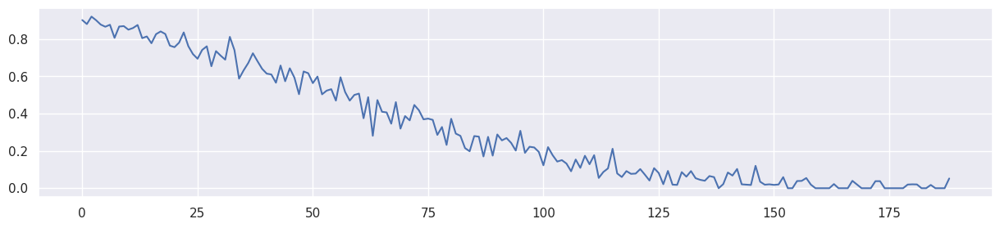

Mean F1 for all data: 0.31696155949087323


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


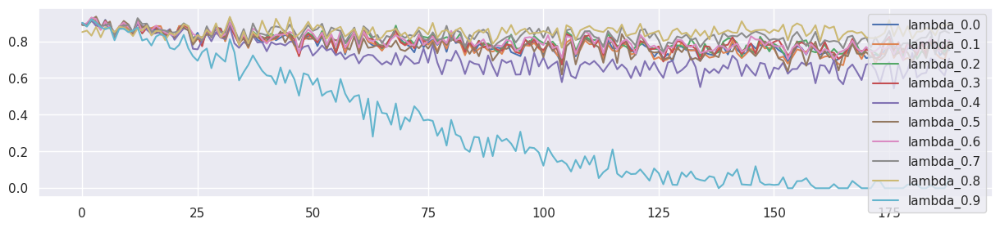

In [91]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.7]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.


lambda_f_set2 = [0.0001478] #,0.000001,0.000002,0.000003,0.000004]
#lambda_f_set2 = [0.00503] #,0.00502,0.00503] #,0.000001,0.000002,0.000003,0.000004]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    lambda_a2 = lambda_f2
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]

    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter = train_model55(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
        result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

        result_table2['lambda'].append(lambda_f)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
        result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
        result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
        result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])


+ 유효기간을 더 연장하다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 108.223732] [G loss: 0.663300]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 232.217194] [G loss: 0.572286]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 270.647491] [G loss: 0.512803]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 316.561554] [G loss: 0.471976]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 343.138428] [G loss: 0.436933]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 346.592957] [G loss: 0.405147]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 316.436310] [G loss: 0.374821]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 284.990967] [G loss: 0.344492]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 217.490677] [G loss: 0.315509]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 194.897461] [G loss: 0.290141]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 172.147659] [G loss: 0.270377]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 156.428391] [G loss: 0.25

100%|██████████| 189/189 [00:00<00:00, 459.11it/s]


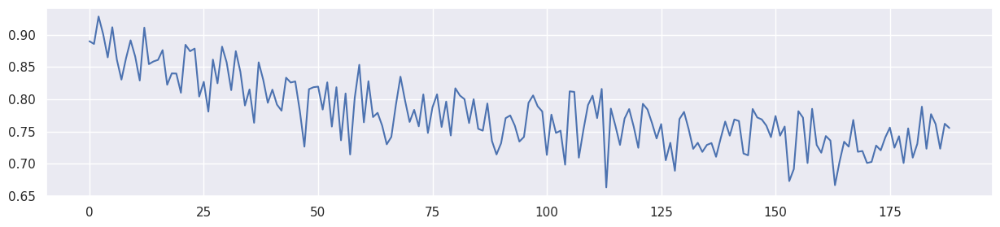

Mean F1 for all data: 0.7787181667018761
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 105.782974] [G loss: 0.663588]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 225.265244] [G loss: 0.571994]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 259.615204] [G loss: 0.512829]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 286.691681] [G loss: 0.472507]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 294.541168] [G loss: 0.436676]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 285.699554] [G loss: 0.381110]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 223.252014] [G loss: 0.346246]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 179.321060] [G loss: 0.316148]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 144.626740] [G loss: 0.290075]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 128.326401] [G loss: 0.271059]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 109.416115] [G loss: 0.257096]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 473.23it/s]


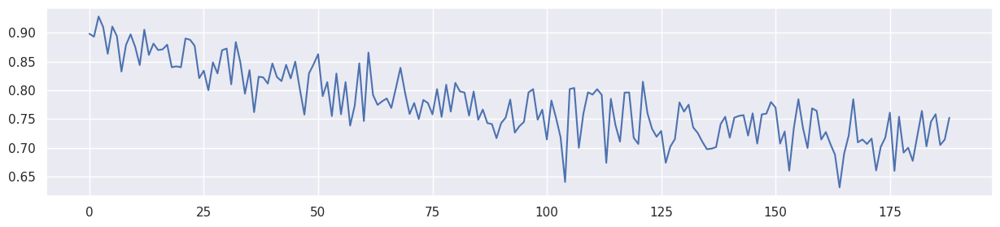

Mean F1 for all data: 0.77635886203553
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 103.328072] [G loss: 0.664072]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 218.130371] [G loss: 0.572697]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 246.398056] [G loss: 0.513136]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 254.423050] [G loss: 0.473129]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 247.459671] [G loss: 0.437000]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 225.907639] [G loss: 0.402513]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 198.716568] [G loss: 0.369667]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 163.226074] [G loss: 0.338247]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 139.999924] [G loss: 0.308371]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 123.135246] [G loss: 0.284201]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 111.258331] [G loss: 0.265349]
[Lambda: 0.200000] [Epoch 2400/40

100%|██████████| 189/189 [00:00<00:00, 454.50it/s]


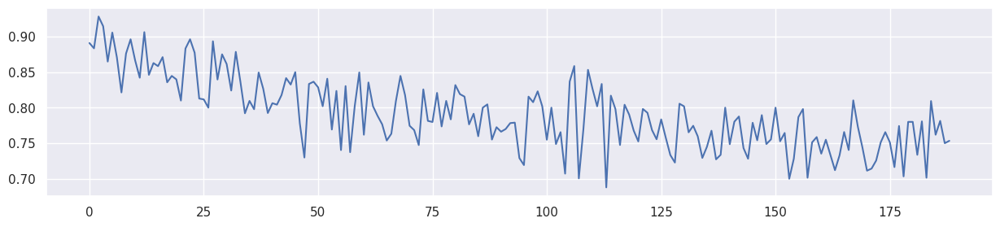

Mean F1 for all data: 0.7922047576320926
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 101.642685] [G loss: 0.664678]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 209.051315] [G loss: 0.573828]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 231.915314] [G loss: 0.513762]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 227.175140] [G loss: 0.474012]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 216.651993] [G loss: 0.437303]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 194.500198] [G loss: 0.401942]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 169.363800] [G loss: 0.368383]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 140.141602] [G loss: 0.336342]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 121.127724] [G loss: 0.306374]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 108.859810] [G loss: 0.281881]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 101.370399] [G loss: 0.263879]
[Lambda: 0.300000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 466.15it/s]


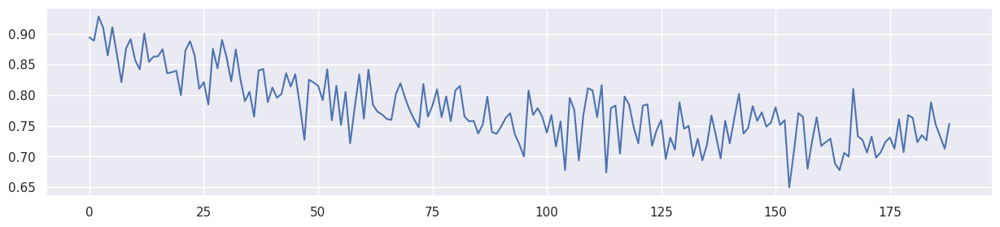

Mean F1 for all data: 0.777282451193728
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 99.886406] [G loss: 0.665513]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 197.042358] [G loss: 0.576178]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 213.823227] [G loss: 0.514874]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 205.938339] [G loss: 0.475177]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 189.076950] [G loss: 0.438437]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 166.968094] [G loss: 0.401728]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 143.099884] [G loss: 0.367270]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 123.779236] [G loss: 0.334461]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 109.580017] [G loss: 0.303903]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 93.001999] [G loss: 0.279932]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 79.192795] [G loss: 0.259296]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 476.64it/s]


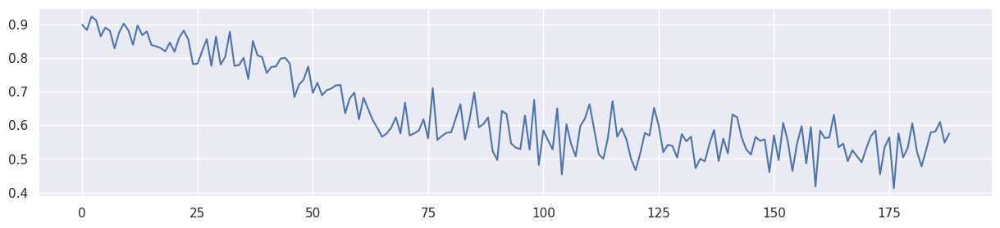

Mean F1 for all data: 0.639249468130879
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 97.788918] [G loss: 0.666567]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 182.410828] [G loss: 0.579247]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 200.266525] [G loss: 0.516289]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 186.787155] [G loss: 0.477295]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 166.198502] [G loss: 0.440701]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 145.346558] [G loss: 0.401908]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 127.595810] [G loss: 0.365533]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 109.830887] [G loss: 0.332213]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 94.335808] [G loss: 0.300766]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 83.681664] [G loss: 0.274702]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 77.983475] [G loss: 0.256368]
[Lambda: 0.500000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 476.26it/s]


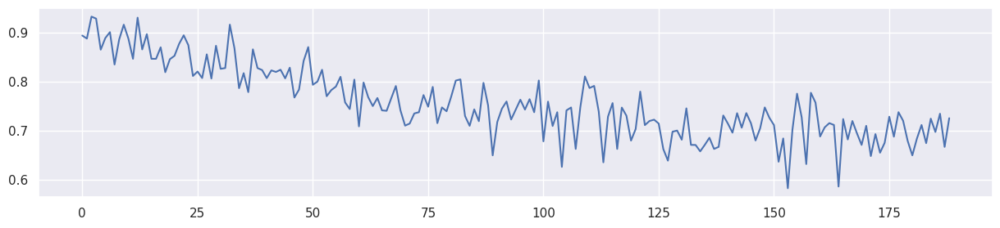

Mean F1 for all data: 0.7566242822335348
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 95.719429] [G loss: 0.668006]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 160.993835] [G loss: 0.591618]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 182.293259] [G loss: 0.520566]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 165.018448] [G loss: 0.480168]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 144.068848] [G loss: 0.440660]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 125.700218] [G loss: 0.400670]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 107.289101] [G loss: 0.361998]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 92.234962] [G loss: 0.324305]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 82.979668] [G loss: 0.290257]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 77.713509] [G loss: 0.265580]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 74.159760] [G loss: 0.248383]
[Lambda: 0.600000] [Epoch 2400/4000]

100%|██████████| 189/189 [00:00<00:00, 472.20it/s]


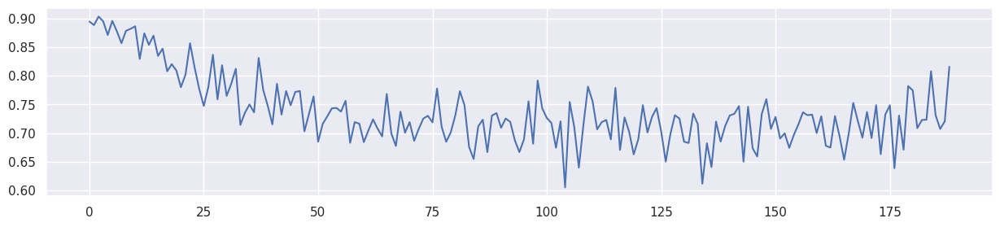

Mean F1 for all data: 0.738143578495091
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 93.876526] [G loss: 0.669395]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 138.312439] [G loss: 0.607139]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 165.224411] [G loss: 0.528800]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 144.462219] [G loss: 0.484571]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 125.548019] [G loss: 0.440772]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 107.944443] [G loss: 0.396542]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 93.799469] [G loss: 0.352257]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 84.729523] [G loss: 0.311508]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 79.177948] [G loss: 0.279003]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 75.549477] [G loss: 0.256106]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 73.138107] [G loss: 0.242065]
[Lambda: 0.700000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 473.63it/s]


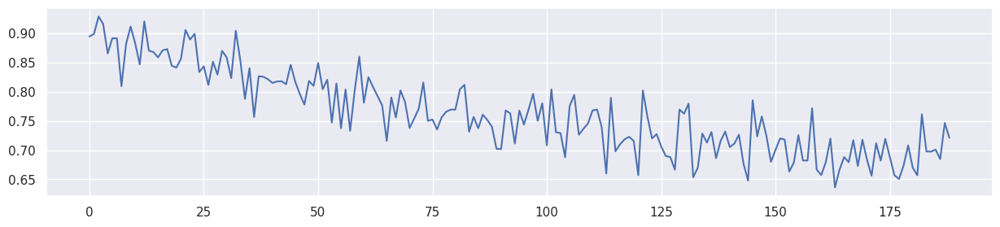

Mean F1 for all data: 0.7635715789732077
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 92.723511] [G loss: 0.670305]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 89.146370] [G loss: 0.646817]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 85.495926] [G loss: 0.616318]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 81.624245] [G loss: 0.576955]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 77.460770] [G loss: 0.526440]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 73.326775] [G loss: 0.469271]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 69.668434] [G loss: 0.416513]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 66.685867] [G loss: 0.376130]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 64.369774] [G loss: 0.350362]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 62.601162] [G loss: 0.336253]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 61.196815] [G loss: 0.329088]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 477.20it/s]


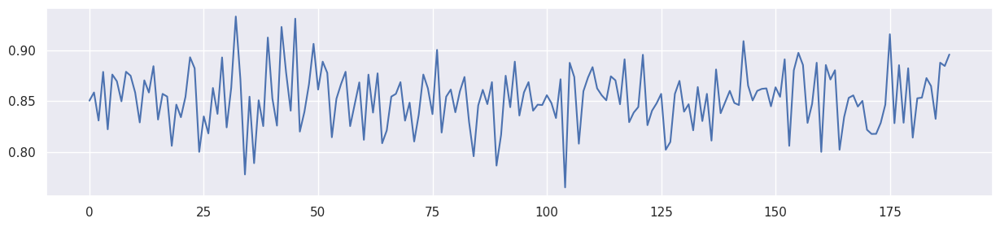

Mean F1 for all data: 0.8527776475629777
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 96.868950] [G loss: 0.687076]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 70.132027] [G loss: 0.675432]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 32.705696] [G loss: 0.643234]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 31.037703] [G loss: 0.611520]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.678391] [G loss: 0.543549]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 42.336670] [G loss: 0.347814]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 39.691940] [G loss: 0.289755]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 36.587917] [G loss: 0.263706]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 34.509300] [G loss: 0.249075]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 33.200317] [G loss: 0.240401]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 32.352848] [G loss: 0.234822]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 31.749725] [G loss: 0.231277]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 445.85it/s]


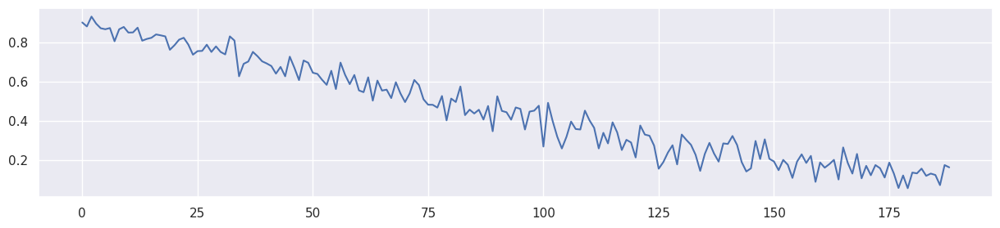

Mean F1 for all data: 0.45149401291335517


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


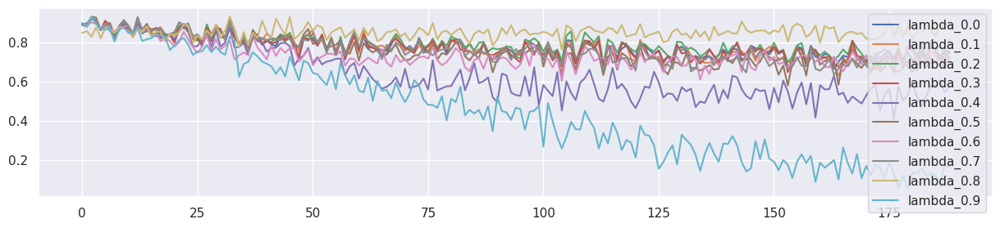

In [55]:
seed_everything()

train_result = []

avaible_range = 800

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



## D(G(x,b)) 구조

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 상기와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

In [118]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        
        for i in range(self.input_dim): 
            self.fc1.append(nn.Linear(2, 15))
            self.fc2.append(nn.Linear(15, 5))
            self.fc3.append(nn.Linear(5, 1))

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            #h0 = F.relu(self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1)))
            #h1 = F.relu(self.fc2[i](h0))
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            h1 = self.fc2[i](h0)
            h2 = self.fc3[i](h1)
            pxy.append(h2)
            
        return torch.cat(pxy, dim=1)

In [93]:

def test_model6(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [112]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model6(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):

    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model6(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [59]:
def test_all_data6(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 48.041508] [G loss: 0.526190]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 578.849670] [G loss: 0.251971]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 1114.308105] [G loss: 0.229426]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 1293.327515] [G loss: 0.226416]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 1323.754517] [G loss: 0.225327]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 1316.896240] [G loss: 0.224496]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 1299.048828] [G loss: 0.223677]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 1320.309814] [G loss: 0.222802]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 1387.811768] [G loss: 0.221883]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 1454.730103] [G loss: 0.221018]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 1555.098389] [G loss: 0.220080]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 1681.058228] [G lo

100%|██████████| 189/189 [00:00<00:00, 345.38it/s]


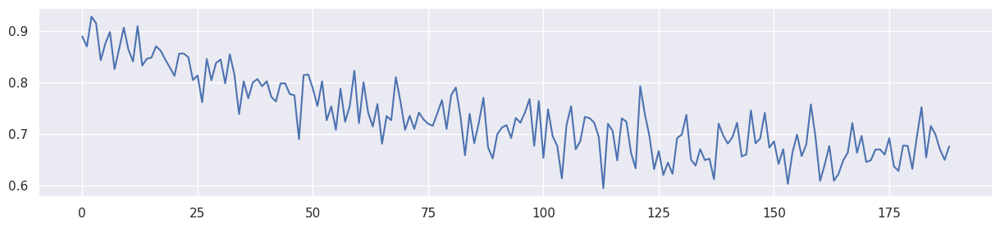

Mean F1 for all data: 0.7328577498067254
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 46.267361] [G loss: 0.528149]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 408.271820] [G loss: 0.259710]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 384.789307] [G loss: 0.233666]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 281.643311] [G loss: 0.229310]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 219.166992] [G loss: 0.227256]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 179.370895] [G loss: 0.225827]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 152.434341] [G loss: 0.224851]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 132.438293] [G loss: 0.224050]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 116.685501] [G loss: 0.223358]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 104.256073] [G loss: 0.222652]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 93.856049] [G loss: 0.221937]
[Lambda: 0.100000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 364.69it/s]


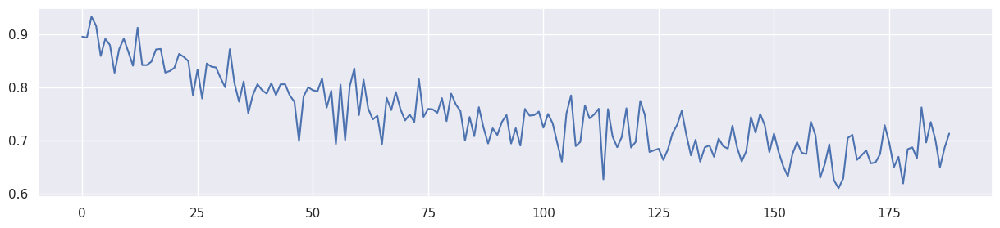

Mean F1 for all data: 0.7469075311867472
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 43.273251] [G loss: 0.532522]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 298.307739] [G loss: 0.267350]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 244.035751] [G loss: 0.236305]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 178.089600] [G loss: 0.231177]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 138.786575] [G loss: 0.228716]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 113.019295] [G loss: 0.227007]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 95.214058] [G loss: 0.225774]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 81.642265] [G loss: 0.224868]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 71.030991] [G loss: 0.224037]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 61.604279] [G loss: 0.222981]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 54.998638] [G loss: 0.222258]
[Lambda: 0.200000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 351.99it/s]


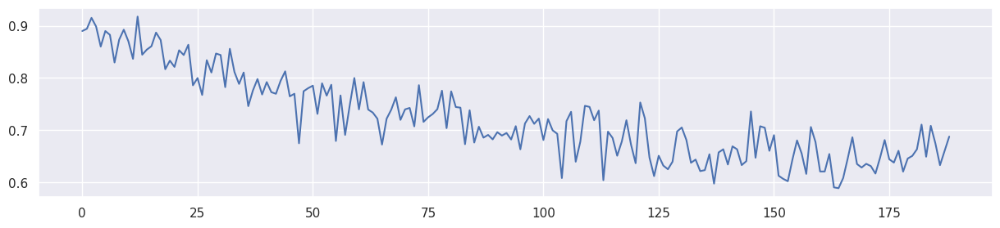

Mean F1 for all data: 0.7228311436538554
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 33.948185] [G loss: 0.553333]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 211.575424] [G loss: 0.262035]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 154.711105] [G loss: 0.237779]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 118.759163] [G loss: 0.232832]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 95.909714] [G loss: 0.230399]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 79.519814] [G loss: 0.228985]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 67.544594] [G loss: 0.228025]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 58.431305] [G loss: 0.227278]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 51.286556] [G loss: 0.226594]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 45.419788] [G loss: 0.225985]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 40.683651] [G loss: 0.225464]
[Lambda: 0.300000] [Epoch 2400/4000] [mi

100%|██████████| 189/189 [00:00<00:00, 360.06it/s]


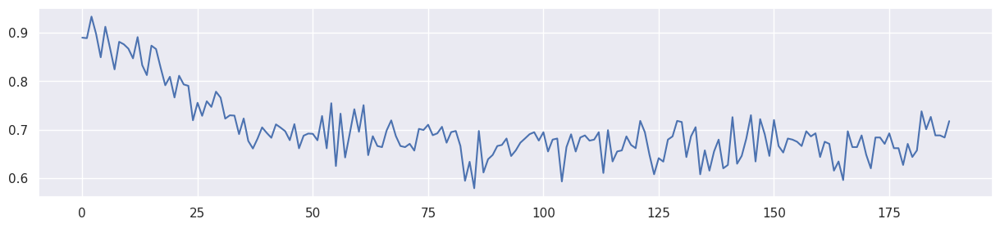

Mean F1 for all data: 0.7007229100717727
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 35.372326] [G loss: 0.546262]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 160.662582] [G loss: 0.270075]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 121.247253] [G loss: 0.244115]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 94.555077] [G loss: 0.236478]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 76.479645] [G loss: 0.232878]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 63.430000] [G loss: 0.230873]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 53.906410] [G loss: 0.229350]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 46.527420] [G loss: 0.228277]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 40.893150] [G loss: 0.227305]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 36.045921] [G loss: 0.226589]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 32.164326] [G loss: 0.225892]
[Lambda: 0.400000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 358.42it/s]


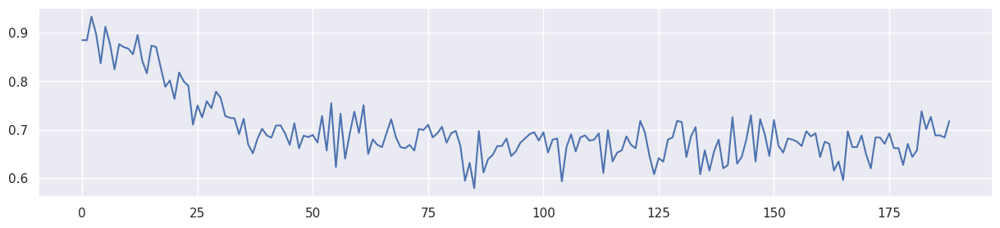

Mean F1 for all data: 0.7000398789465374
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 34.294418] [G loss: 0.544041]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 124.981400] [G loss: 0.281231]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 95.639336] [G loss: 0.250415]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 75.561302] [G loss: 0.240309]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 61.179188] [G loss: 0.235515]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 50.651825] [G loss: 0.232826]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 43.146408] [G loss: 0.230880]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 37.347095] [G loss: 0.229433]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 32.617550] [G loss: 0.228347]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 28.860674] [G loss: 0.227397]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 25.753431] [G loss: 0.226629]
[Lambda: 0.500000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 358.26it/s]


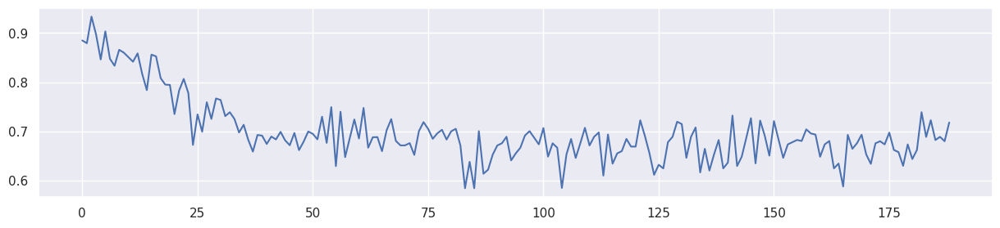

Mean F1 for all data: 0.6987060631645156
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 32.326679] [G loss: 0.542509]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 96.284584] [G loss: 0.294649]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 75.145782] [G loss: 0.258584]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 59.530598] [G loss: 0.245738]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 48.342224] [G loss: 0.239236]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 40.176598] [G loss: 0.235327]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 34.032036] [G loss: 0.232767]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 29.240774] [G loss: 0.231012]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 25.412680] [G loss: 0.229664]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 22.434326] [G loss: 0.228688]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 20.035965] [G loss: 0.227837]
[Lambda: 0.600000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 344.51it/s]


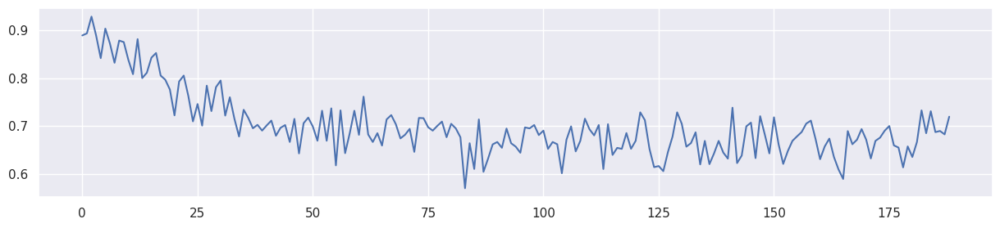

Mean F1 for all data: 0.6995595343469444
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 29.225805] [G loss: 0.545400]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 70.438652] [G loss: 0.318002]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 57.053501] [G loss: 0.271941]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 46.213963] [G loss: 0.254098]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 38.028145] [G loss: 0.244308]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 31.840263] [G loss: 0.238703]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 26.978262] [G loss: 0.235329]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 23.296900] [G loss: 0.232814]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 20.332094] [G loss: 0.231160]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 17.992825] [G loss: 0.229799]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 15.970486] [G loss: 0.228897]
[Lambda: 0.700000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 352.96it/s]


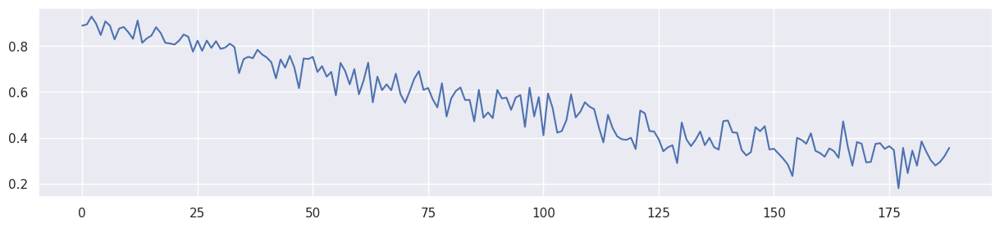

Mean F1 for all data: 0.5549057008983822
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 9.969014] [G loss: 0.629574]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 41.790180] [G loss: 0.424737]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 42.618046] [G loss: 0.316754]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 33.626156] [G loss: 0.272219]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 26.448822] [G loss: 0.254250]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 21.292530] [G loss: 0.245288]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 17.627277] [G loss: 0.239861]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 15.072354] [G loss: 0.235996]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 13.053971] [G loss: 0.233436]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 11.535751] [G loss: 0.231390]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 10.258926] [G loss: 0.229876]
[Lambda: 0.800000] [Epoch 2400/4000] [mi los

100%|██████████| 189/189 [00:00<00:00, 362.74it/s]


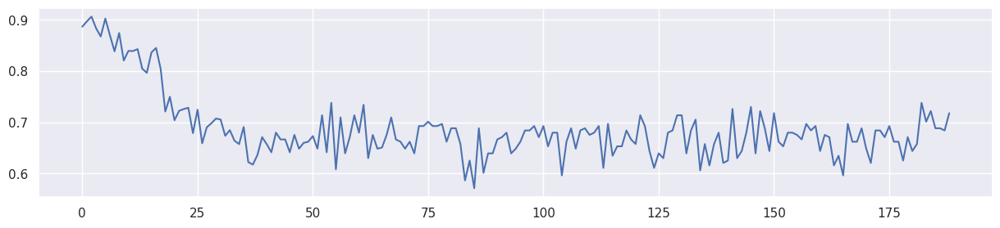

Mean F1 for all data: 0.6877182900933724
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 3.886636] [G loss: 0.693377]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 1.249338] [G loss: 0.658767]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 11.337275] [G loss: 0.509033]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 15.687906] [G loss: 0.376207]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 14.555537] [G loss: 0.307324]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 12.171743] [G loss: 0.275661]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 10.079486] [G loss: 0.259187]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 8.368134] [G loss: 0.249661]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 7.042802] [G loss: 0.243258]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 5.955040] [G loss: 0.238776]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 5.069944] [G loss: 0.235351]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 4.335437] [G loss: 0.232578]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 3.

100%|██████████| 189/189 [00:00<00:00, 355.70it/s]


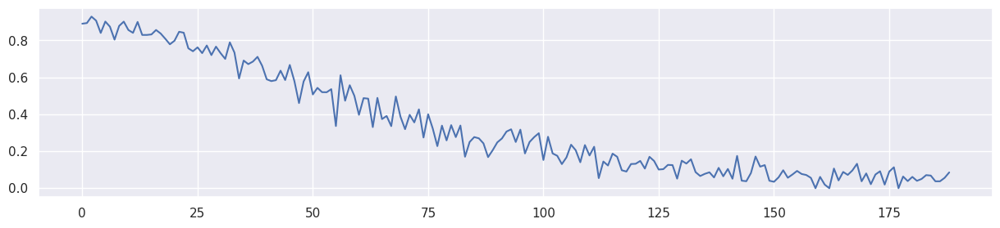

Mean F1 for all data: 0.34092671735037533


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718538,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721652,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732009,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742371,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752737,0.688073,0.230407


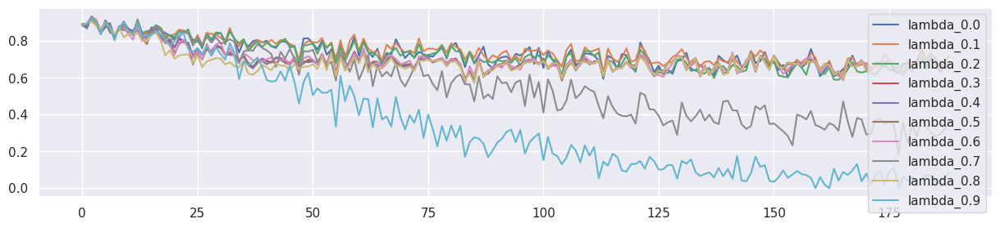

In [119]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model6(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.0005171)
    result_table[f'lambda_{lambda_f}'] = test_all_data6(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



<pre>
x0 ------>|                     |- x'0 --> |                | - x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                | - x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | MINE (I(x',y)) | - x'2 --> | Discriminator (D(x')   | -> y'
x3 ------>|                     |- x'3 --> | MI model       | - x'3 --> | predictive mode        |
z0 ------>|                     |- z'0 --> |                | - z'0 --> |                        |
                     ^
                     |
                     b
</pre>

In [61]:
class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()
        
        for i in range(self.input_dim): 
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H+1, 1))
            #self.fc4.append(nn.Linear(2, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y))
            h1 = self.fc3[i](torch.cat((h0, x[:,-1].reshape(-1,1)), 1) )
            #h2 = self.fc3[i](torch.cat((h0, x[:,-1].reshape(-1,1)), 1) )
            h.append(h1)

        return torch.cat(h, dim=1)  

In [62]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model7(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):

    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(5)
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  Forwards Adapter
        # -------------------------------
        xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  I(x',y)의 MINE loss
        # -------------------------------
        
        s = np.random.choice(XS_train.shape[0],minibatch)
        x_sample = xs[s]
        y_sample = y_train[s].reshape(-1,1)
        y_shuffle = y_train[np.random.permutation(s)].reshape(-1,1)
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1



        optimizer_A.zero_grad()
        optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha + mi_loss.mean() * lambda_a2 *5

        loss.backward()
        optimizer_G.step()
        optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [a2: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, lambda_a2,epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model6(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

[Lambda: 0.700000] [a2: 0.010000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 200/4000] [mi loss: 11.766759] [G loss: 0.611418]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 400/4000] [mi loss: 28.168821] [G loss: 0.433837]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 600/4000] [mi loss: 44.572758] [G loss: 0.291129]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 800/4000] [mi loss: 37.974926] [G loss: 0.252197]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 1000/4000] [mi loss: 30.547277] [G loss: 0.238597]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 1200/4000] [mi loss: 24.894279] [G loss: 0.231632]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 1400/4000] [mi loss: 20.653961] [G loss: 0.228092]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 1600/4000] [mi loss: 17.545258] [G loss: 0.225943]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 1800/4000] [mi loss: 15.250525] [G loss: 0.224269]
[Lambda: 0.700000] [a2: 0.010000] [Epoch 2000/4000] [mi loss: 13.551076] [G loss: 0.2228

100%|██████████| 189/189 [00:00<00:00, 369.47it/s]


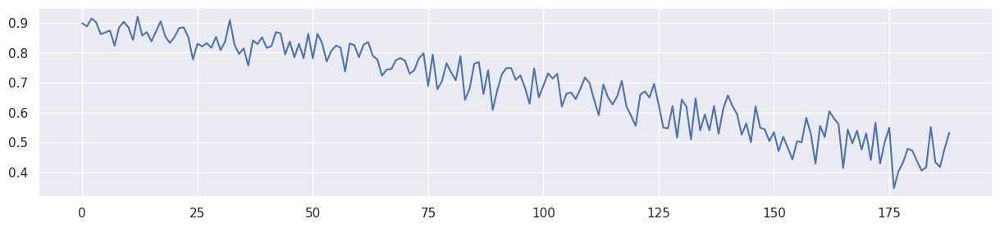

Mean F1 for all data: 0.6873932846847542
     lambda_0.7
0      0.898148
1      0.887805
2      0.914286
3      0.901961
4      0.861878
..          ...
184    0.551282
185    0.433566
186    0.417266
187    0.478873
188    0.531646

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 200/4000] [mi loss: 10.013682] [G loss: 0.622925]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 400/4000] [mi loss: 24.735796] [G loss: 0.446014]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 600/4000] [mi loss: 41.162018] [G loss: 0.299166]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 800/4000] [mi loss: 35.653008] [G loss: 0.251426]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 1000/4000] [mi loss: 28.655195] [G loss: 0.236916]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 1200/4000] [mi loss: 23.538403] [G loss: 0.230802]
[Lambda: 0.700000] [a2: 0.020000] [Epoch 1400/4000] [mi loss: 19.765469] [G loss: 0.227424]
[Lambda: 0.7000

100%|██████████| 189/189 [00:00<00:00, 370.55it/s]


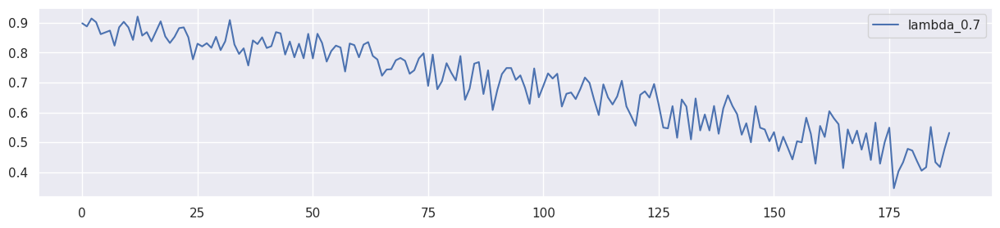

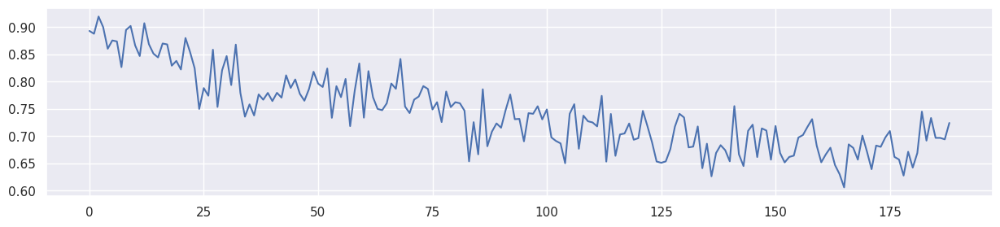

Mean F1 for all data: 0.7429513709419675
     lambda_0.7
0      0.893023
1      0.887805
2      0.919431
3      0.900000
4      0.860335
..          ...
184    0.733333
185    0.696864
186    0.696864
187    0.694158
188    0.724252

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 200/4000] [mi loss: 8.672402] [G loss: 0.632227]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 400/4000] [mi loss: 23.187141] [G loss: 0.453911]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 600/4000] [mi loss: 39.683556] [G loss: 0.316071]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 800/4000] [mi loss: 36.794819] [G loss: 0.250879]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 1000/4000] [mi loss: 28.612076] [G loss: 0.236794]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 1200/4000] [mi loss: 23.361351] [G loss: 0.231256]
[Lambda: 0.700000] [a2: 0.030000] [Epoch 1400/4000] [mi loss: 19.672916] [G loss: 0.228615]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 374.80it/s]


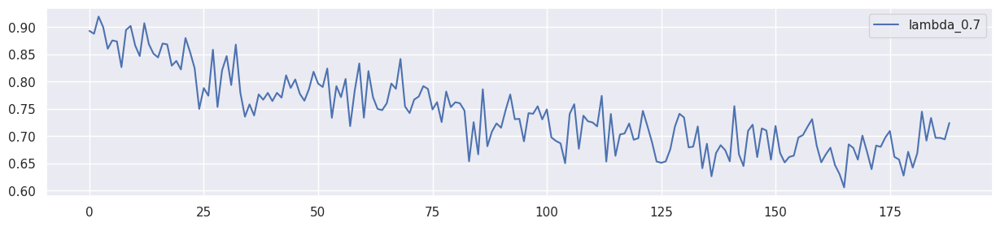

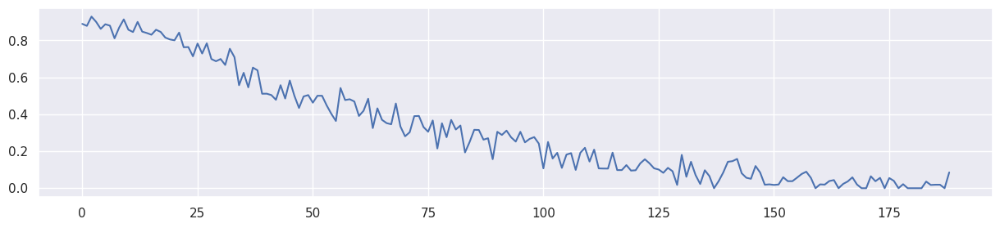

Mean F1 for all data: 0.3194373167386794
     lambda_0.7
0      0.888889
1      0.878049
2      0.928230
3      0.900000
4      0.861878
..          ...
184    0.017544
185    0.018868
186    0.018868
187    0.000000
188    0.085470

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 200/4000] [mi loss: 7.729173] [G loss: 0.640831]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 400/4000] [mi loss: 20.375763] [G loss: 0.467275]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 600/4000] [mi loss: 35.777061] [G loss: 0.318870]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 800/4000] [mi loss: 35.404099] [G loss: 0.251491]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 1000/4000] [mi loss: 28.010073] [G loss: 0.237059]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 1200/4000] [mi loss: 22.846697] [G loss: 0.231289]
[Lambda: 0.700000] [a2: 0.040000] [Epoch 1400/4000] [mi loss: 19.254208] [G loss: 0.228155]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 375.58it/s]


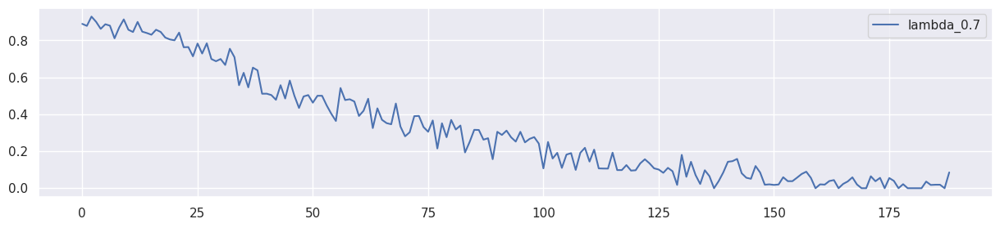

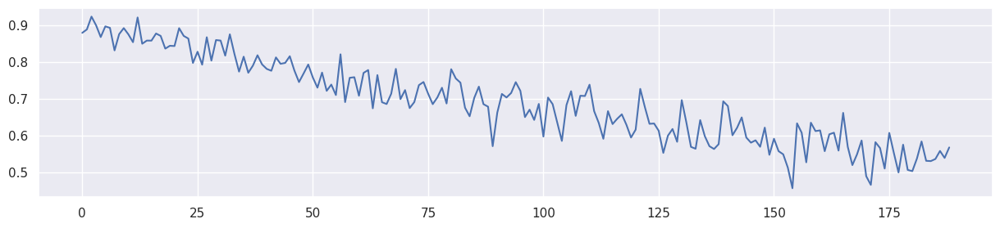

Mean F1 for all data: 0.6929959231521893
     lambda_0.7
0      0.879630
1      0.888889
2      0.923810
3      0.900000
4      0.868132
..          ...
184    0.530864
185    0.536585
186    0.558442
187    0.539474
188    0.568047

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 200/4000] [mi loss: 7.066977] [G loss: 0.646396]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 400/4000] [mi loss: 18.572927] [G loss: 0.481238]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 600/4000] [mi loss: 32.527061] [G loss: 0.331174]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 800/4000] [mi loss: 34.254662] [G loss: 0.254583]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 1000/4000] [mi loss: 27.949856] [G loss: 0.237970]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 1200/4000] [mi loss: 22.900980] [G loss: 0.232176]
[Lambda: 0.700000] [a2: 0.050000] [Epoch 1400/4000] [mi loss: 19.402328] [G loss: 0.228812]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 370.54it/s]


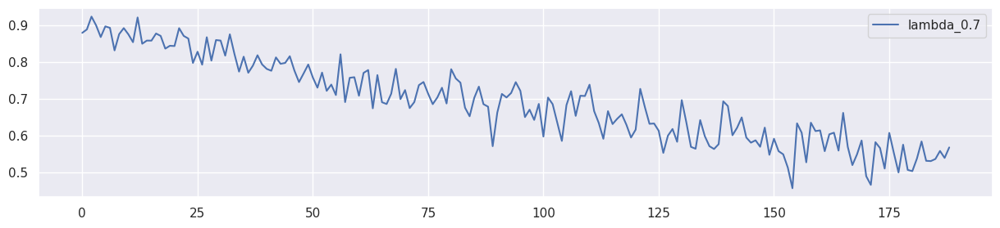

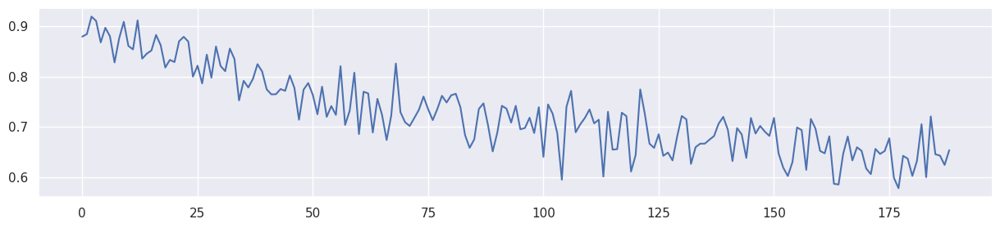

Mean F1 for all data: 0.7275770217606632
     lambda_0.7
0      0.879630
1      0.884615
2      0.919431
3      0.910891
4      0.868132
..          ...
184    0.720812
185    0.645503
186    0.642857
187    0.624277
188    0.653659

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 200/4000] [mi loss: 6.569496] [G loss: 0.652775]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 400/4000] [mi loss: 16.637213] [G loss: 0.491329]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 600/4000] [mi loss: 30.413990] [G loss: 0.335728]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 800/4000] [mi loss: 34.088131] [G loss: 0.254739]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 1000/4000] [mi loss: 27.431993] [G loss: 0.238668]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 1200/4000] [mi loss: 23.040977] [G loss: 0.231760]
[Lambda: 0.700000] [a2: 0.060000] [Epoch 1400/4000] [mi loss: 19.347799] [G loss: 0.228425]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 345.79it/s]


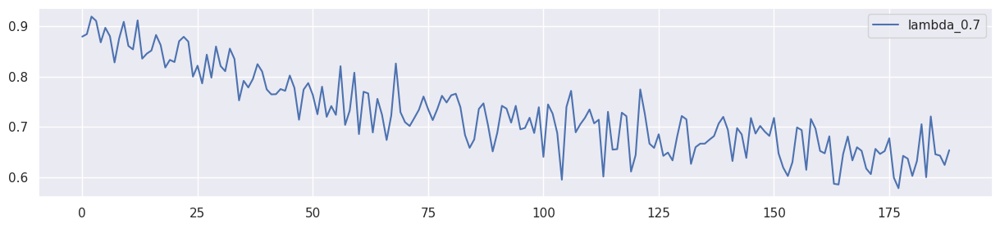

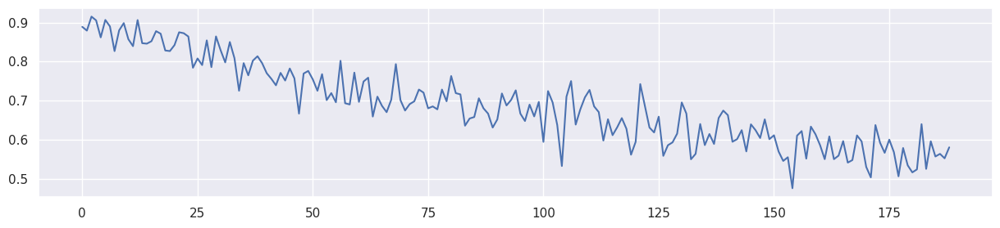

Mean F1 for all data: 0.6896815924640797
     lambda_0.7
0      0.888889
1      0.879227
2      0.915094
3      0.905473
4      0.861878
..          ...
184    0.595745
185    0.556818
186    0.563536
187    0.552147
188    0.580311

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 200/4000] [mi loss: 5.794513] [G loss: 0.669349]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 400/4000] [mi loss: 12.781380] [G loss: 0.560601]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 600/4000] [mi loss: 24.199177] [G loss: 0.425864]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 800/4000] [mi loss: 29.182611] [G loss: 0.350559]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 1000/4000] [mi loss: 24.717854] [G loss: 0.319635]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 1200/4000] [mi loss: 20.579826] [G loss: 0.243885]
[Lambda: 0.700000] [a2: 0.070000] [Epoch 1400/4000] [mi loss: 17.394711] [G loss: 0.233572]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 357.21it/s]


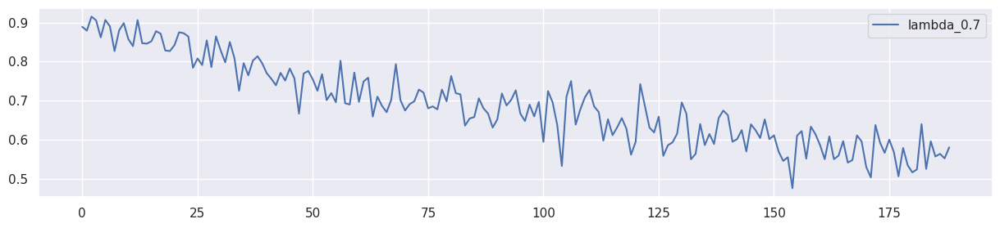

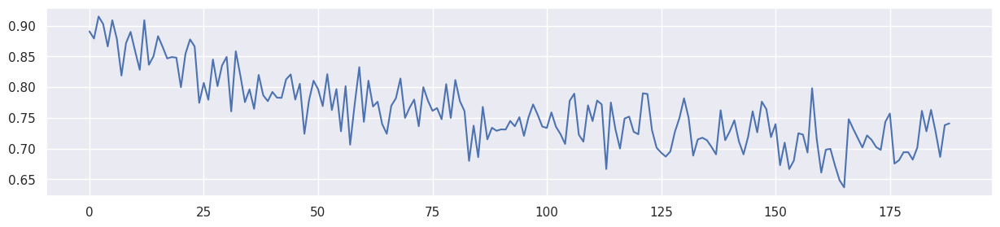

Mean F1 for all data: 0.7612052906665111
     lambda_0.7
0      0.890909
1      0.879227
2      0.915094
3      0.902913
4      0.866310
..          ...
184    0.763052
185    0.727273
186    0.686441
187    0.738197
188    0.741036

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 200/4000] [mi loss: 5.569386] [G loss: 0.672440]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 400/4000] [mi loss: 11.705080] [G loss: 0.574270]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 600/4000] [mi loss: 21.880938] [G loss: 0.454320]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 800/4000] [mi loss: 28.331667] [G loss: 0.357360]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 1000/4000] [mi loss: 25.277618] [G loss: 0.313291]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 1200/4000] [mi loss: 21.266413] [G loss: 0.241763]
[Lambda: 0.700000] [a2: 0.080000] [Epoch 1400/4000] [mi loss: 18.403141] [G loss: 0.234194]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 339.71it/s]


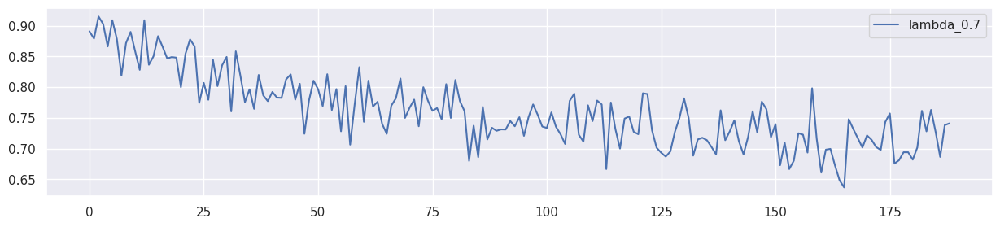

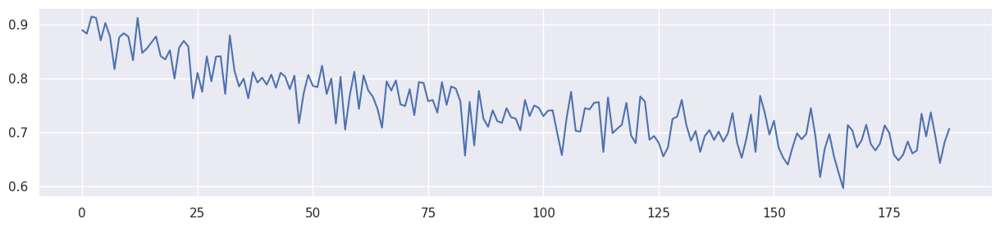

Mean F1 for all data: 0.7485095856307966
     lambda_0.7
0      0.889908
1      0.883495
2      0.915094
3      0.912621
4      0.870968
..          ...
184    0.737226
185    0.692607
186    0.643137
187    0.681992
188    0.706767

[189 rows x 1 columns]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 0/4000] [mi loss: 4.275191] [G loss: 0.692794]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 200/4000] [mi loss: 5.463139] [G loss: 0.673369]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 400/4000] [mi loss: 11.241801] [G loss: 0.579983]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 600/4000] [mi loss: 19.602222] [G loss: 0.466253]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 800/4000] [mi loss: 26.661232] [G loss: 0.371751]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 1000/4000] [mi loss: 25.207151] [G loss: 0.312876]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 1200/4000] [mi loss: 22.704643] [G loss: 0.240395]
[Lambda: 0.700000] [a2: 0.090000] [Epoch 1400/4000] [mi loss: 19.059633] [G loss: 0.234129]
[Lambda: 0.70000

100%|██████████| 189/189 [00:00<00:00, 372.93it/s]


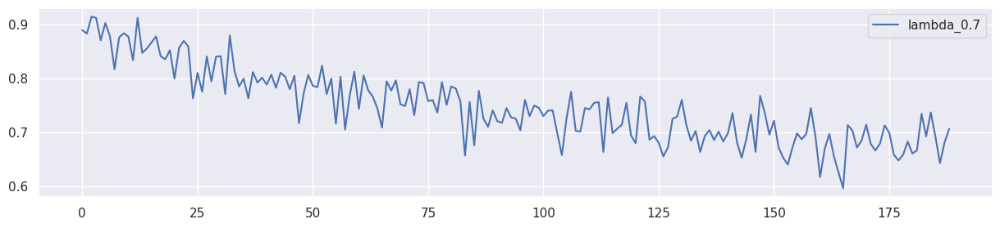

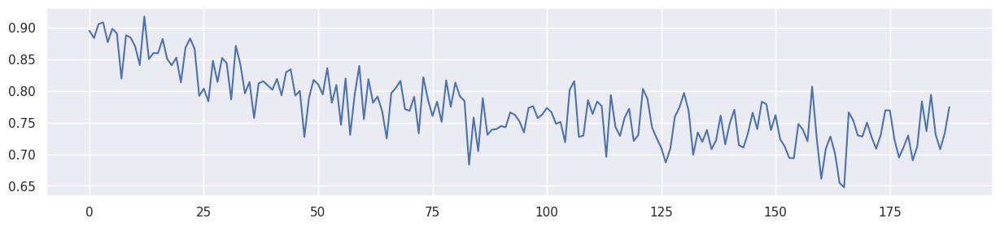

Mean F1 for all data: 0.7748061117547762
     lambda_0.7
0      0.894977
1      0.883495
2      0.905660
3      0.908213
4      0.877005
..          ...
184    0.793893
185    0.731092
186    0.707819
187    0.733333
188    0.774436

[189 rows x 1 columns]


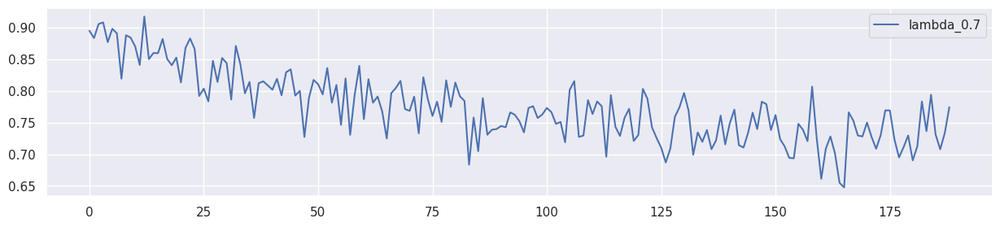

In [63]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

#lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
lambda_f_set = [0.7]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

lambda_f_set2 = [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09] 
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    lambda_a2 = lambda_f2
        
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter = train_model7(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000517)
        result_table[f'lambda_{lambda_f}'] = test_all_data6(last_generator,last_adapter,2000)

        result_table2['lambda'].append(lambda_f)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
        result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
        result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=(15,3))

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

